In [2]:
#this is to auto-reload modules (like utils.py)
%load_ext autoreload
%autoreload 2

from IPython.core.display import display, HTML
from IPython.display import clear_output

import os
import sys
import time
import gc
import json
import glob
import ast

import shutil
import joblib
import itertools


#needed to import utils.py
sys.path.append('../') 
import utils

import scipy

import numpy as np
import pandas as pd
# config to not reduce column width
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)


import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap

# from mycolorpy import colorlist as mcp


import seaborn as sns
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('seaborn-whitegrid')


import plotly as ply
import plotly.express as px

from itertools import permutations, combinations

from tabulate import tabulate

import pickle
from joblib import dump, load


import sklearn
from sklearn.model_selection import StratifiedKFold, ParameterGrid
from sklearn.model_selection import GridSearchCV, cross_validate, train_test_split
from sklearn.pipeline import Pipeline

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import ComplementNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier, AdaBoostClassifier




import shap as shap
shap.initjs()

# import interpret

# from collections import Counter


# import warnings
# warnings.simplefilter(action='ignore', category=FutureWarning)
# warnings.filterwarnings('always')

# Surpress warnings:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn


# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)


SMALL_SIZE = 8
MEDIUM_SIZE = 8
BIGGER_SIZE = 8

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

%matplotlib inline  



/tmp/ipykernel_124790/703756968.py:5: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [4]:
# get train and tezt sets INCLUDING the Diagnosis_Delay feature
X_train, y_train, X_valid, y_valid = utils.get_train_and_validation_data(
    scaled=False,
    coded=True,
    use_diagnosis_delay=True
)

# X_all = pd.concat([X_train, X_valid])
# y_all = pd.DataFrame(np.concatenate((y_train, y_valid)), columns=['Survival_Group'])

y_valid['Class'] = y_valid.Survival_Group.apply(
    lambda x: 'Short' if x == 1 else 'Non-Short'
)

# X_all['Survival_Group'] = y_all


X_decoded_cleaned = utils.get_decoded_data(X_valid)
X_decoded_cleaned


,Sex,Site_Onset,Diagnosis_Delay,Age_at_Onset,Riluzole,FVC_at_Diagnosis,BMI_at_Diagnosis,Q1_Speech_slope_at_Diagnosis,Q2_Salivation_slope_at_Diagnosis,Q3_Swallowing_slope_at_Diagnosis,Q4_Handwriting_slope_at_Diagnosis,Q5_Cutting_slope_at_Diagnosis,Q6_Dressing_and_Hygiene_slope_at_Diagnosis,Q7_Turning_in_Bed_slope_at_Diagnosis,Q8_Walking_slope_at_Diagnosis,Q9_Climbing_Stairs_slope_at_Diagnosis,Q10_Respiratory_slope_at_Diagnosis,Qty_Regions_Involved_at_Diagnosis,Region_Involved_Bulbar_at_Diagnosis,Region_Involved_Upper_Limb_at_Diagnosis,Region_Involved_Lower_Limb_at_Diagnosis,Region_Involved_Respiratory_at_Diagnosis,Patient_with_Gastrostomy_at_Diagnosis
0,Male,Limb/Spinal,Long,60-69,Yes,Normal,Overweight,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Average,Slow,3,No,Yes,Yes,Yes,No
1,Female,Bulbar,Short,40-49,No,Abnormal,Normal,Average,Average,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,1,Yes,No,No,No,No
2,Male,Limb/Spinal,Average,60-69,No,Abnormal,Overweight,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,4,Yes,Yes,Yes,Yes,No
3,Female,Limb/Spinal,Short,40-49,No,Abnormal,Obesity,Average,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Average,Average,4,Yes,Yes,Yes,Yes,No
4,Male,Limb/Spinal,Average,50-59,No,Normal,Obesity,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,1,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
389,Female,Limb/Spinal,Short,40-49,No,Abnormal,Normal,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,3,No,Yes,Yes,Yes,No
390,Female,Limb/Spinal,Long,60-69,No,Abnormal,Obesity,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Average,Slow,1,No,No,Yes,No,No
391,Female,Limb/Spinal,Short,60-69,No,Normal,Normal,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Average,Average,Slow,1,No,No,Yes,No,No
392,Female,Limb/Spinal,Short,60-69,No,Abnormal,Normal,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,Slow,3,No,Yes,Yes,Yes,No


# Load serialized SHAP values from disk

In [6]:
file = 'saved_shap_explainer/SHAP_KernelExplainer_BalBag_DT.model'
with open(file, 'rb') as fl:
    explainer_loaded = pickle.load(fl)

file = 'saved_shap_explainer/SHAP_KernelExplainer_values_BalBag_DT.model'
# file = 'saved_models/SHAP_explainer_SVM.model'
with open(file, 'rb') as fl:
    shap_values_loaded = pickle.load(fl)


rows_total = shap_values_loaded.shape[0]

rows_max = int (rows_total/3)
rows_max = rows_total

    
shap_values = shap_values_loaded #.values[0:rows_max]    
rows = shap_values.shape[0]

display(rows)

# print(explainer_loaded.feature_names)






394

In [7]:
short_indexes = y_valid.loc[(y_valid.Survival_Group == 1)]
# short_samples = shap_values[short_indexes.index]
display(short_indexes)

non_short_indexes = y_valid.loc[(y_valid.Survival_Group == 0)]
# non_short_samples = shap_values[non_short_indexes.index]
display(non_short_indexes)

,Survival_Group,Class
11,1,Short
15,1,Short
19,1,Short
21,1,Short
34,1,Short
44,1,Short
52,1,Short
62,1,Short
65,1,Short
80,1,Short


,Survival_Group,Class
0,0,Non-Short
1,0,Non-Short
2,0,Non-Short
3,0,Non-Short
4,0,Non-Short
...,...,...
389,0,Non-Short
390,0,Non-Short
391,0,Non-Short
392,0,Non-Short


In [8]:
shap_values

.values =
array([[ 0.        ,  0.        , -0.14685827, ...,  0.        ,
         0.        , -0.00058468],
       [-0.03060159, -0.03776043,  0.32820838, ...,  0.        ,
        -0.00851419,  0.        ],
       [ 0.00220419, -0.00195264, -0.07719539, ...,  0.00106523,
         0.00070667,  0.0017819 ],
       ...,
       [ 0.        ,  0.        ,  0.15070467, ...,  0.        ,
         0.        ,  0.        ],
       [-0.00170541, -0.04400054,  0.16856317, ..., -0.00475822,
        -0.00228949, -0.00220806],
       [ 0.        ,  0.0103302 , -0.0648232 , ...,  0.        ,
         0.        ,  0.        ]])

.base_values =
array([0.28426396, 0.28426396, 0.28426396, 0.28426396, 0.28426396,
       0.28426396, 0.28426396, 0.28426396, 0.28426396, 0.28426396,
       0.28426396, 0.28426396, 0.28426396, 0.28426396, 0.28426396,
       0.28426396, 0.28426396, 0.28426396, 0.28426396, 0.28426396,
       0.28426396, 0.28426396, 0.28426396, 0.28426396, 0.28426396,
       0.28426396, 0.28426

---
# Create a SHAP $Explanation$ object with the SHAP values loaded from disk

In [13]:
feature_names = []

for f in X_valid.columns:
    feature_names.append(f.replace('_at_Diagnosis', ''))

# feature_names

In [14]:
explanation = shap.Explanation(
    values=shap_values.values, 
    base_values=shap_values.base_values[0],
    feature_names=feature_names,
    data = X_decoded_cleaned.values,
)

explanation


.values =
array([[ 0.        ,  0.        , -0.14685827, ...,  0.        ,
         0.        , -0.00058468],
       [-0.03060159, -0.03776043,  0.32820838, ...,  0.        ,
        -0.00851419,  0.        ],
       [ 0.00220419, -0.00195264, -0.07719539, ...,  0.00106523,
         0.00070667,  0.0017819 ],
       ...,
       [ 0.        ,  0.        ,  0.15070467, ...,  0.        ,
         0.        ,  0.        ],
       [-0.00170541, -0.04400054,  0.16856317, ..., -0.00475822,
        -0.00228949, -0.00220806],
       [ 0.        ,  0.0103302 , -0.0648232 , ...,  0.        ,
         0.        ,  0.        ]])

.base_values =
0.2842639593908629

.data =
array([['Male', 'Limb/Spinal', 'Long', ..., 'Yes', 'Yes', 'No'],
       ['Female', 'Bulbar', 'Short', ..., 'No', 'No', 'No'],
       ['Male', 'Limb/Spinal', 'Average', ..., 'Yes', 'Yes', 'No'],
       ...,
       ['Female', 'Limb/Spinal', 'Short', ..., 'Yes', 'No', 'No'],
       ['Female', 'Limb/Spinal', 'Short', ..., 'Yes', 'Yes',

In [16]:
# df = X_decoded_cleaned.iloc[short_indexes.index].reset_index()
# df = df.loc[(
#     # (df.Sex == 'Male')
#     # &(df.Age_at_Onset == '60-69')
#     (df.Diagnosis_Delay == 'Short')
#     &(df.Q1_Speech_slope_at_Diagnosis == 'Rapid')
#     &(df.Q9_Climbing_Stairs_slope_at_Diagnosis == 'Rapid')
# )]

# display(df)


# display(X_decoded_cleaned.head(5))

# ====================================
# DECISION PLOT FOR PATIENT B
# ====================================
for i in np.arange(0, len(explanation.values)):
# for i in df.index:
    fig, ax = plt.subplots(figsize=(5,5) )
    shap.decision_plot(
        explanation.base_values,
        explanation.values[i],
        X_decoded_cleaned.iloc[i],
        # feature_names=feature_names,
    #     feature_order='none',
        show=False,
    )
    plt.title(f'index: {i}', fontsize=12)
    # plt.show()

    group = y_valid.iloc[i].values[1]
    # print(group)
    
    utils.save_plot(
        plt=plt, 
        folder=f'temp_shap_plots/{group}', 
        file_name=f'patient_index_{i}_{group}', 
        save_in_pdf_format=False,
    )

    plt.close()

    print(f'{i}', end='..')
    


0..1..2..3..4..5..6..7..8..9..10..11..12..13..14..15..16..17..18..19..20..21..22..23..24..25..26..27..28..29..30..31..32..33..34..35..36..37..38..39..40..41..42..43..44..45..46..47..48..49..50..51..52..53..54..55..56..57..58..59..60..61..62..63..64..65..66..67..68..69..70..71..72..73..74..75..76..77..78..79..80..81..82..83..84..85..86..87..88..89..90..91..92..93..94..95..96..97..98..99..100..101..102..103..104..105..106..107..108..109..110..111..112..113..114..115..116..117..118..119..120..121..122..123..124..125..126..127..128..129..130..131..132..133..134..135..136..137..138..139..140..141..142..143..144..145..146..147..148..149..150..151..152..153..154..155..156..157..158..159..160..161..162..163..164..165..166..167..168..169..170..171..172..173..174..175..176..177..178..179..180..181..182..183..184..185..186..187..188..189..190..191..192..193..194..195..196..197..198..199..200..201..202..203..204..205..206..207..208..209..210..211..212..213..214..215..216..217..218..219..220..221..

---
# Plot SHAP graphs

### Define some variables

In [17]:
x_jitter = 0.2
dot_size=3
max_display = 23

display_range = slice(-1, -(max_display+1), -1)

feature_natural_order = list(range(0, 23, 1))

figsize_default = [10,5]
x_ticks_default = [-0.01, 0., 1., 1.5]
x_ticks_default_labels  = ['', 'Non-Short', 'Short', '']


## Plot SHAP Decision graphs for patients $A$ and $B$

xticks values: [-0.1  0.   0.1  0.2  0.3  0.4  0.5  0.6]
xticks modif.: ['', 'Non-Short', '', '', '', '', '', 'Short']


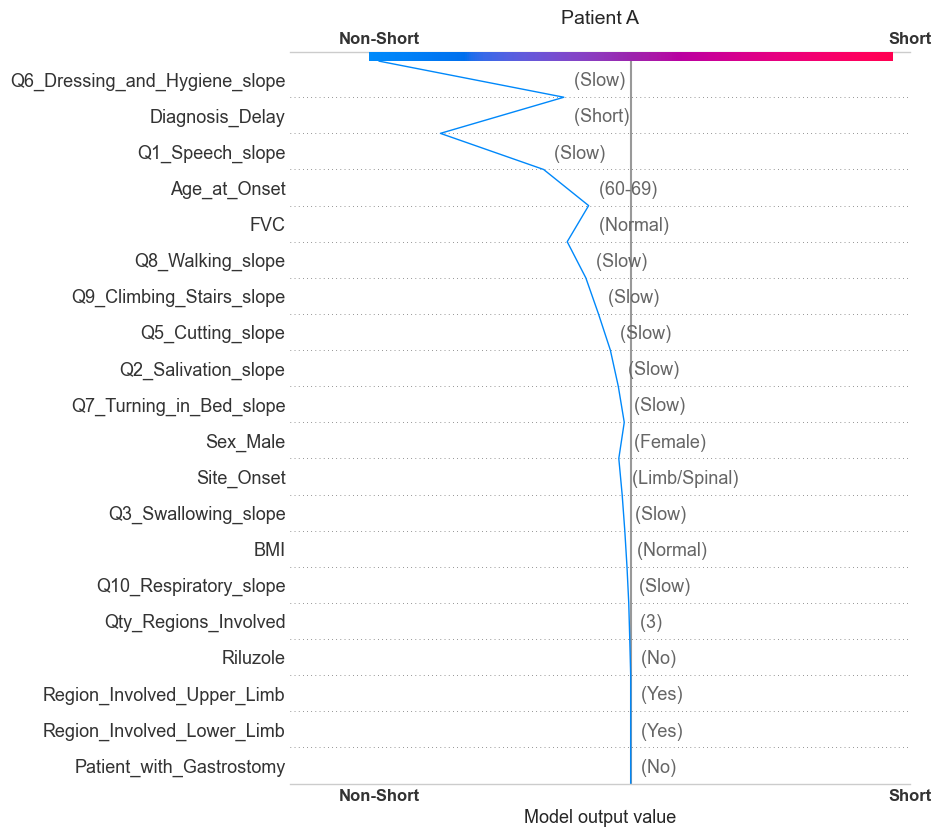

xticks values: [-0.6 -0.4 -0.2  0.   0.2  0.4  0.6  0.8  1.   1.2]
xticks modif.: ['', 'Non-Short', '', '', '', '', '', '', '', 'Short']


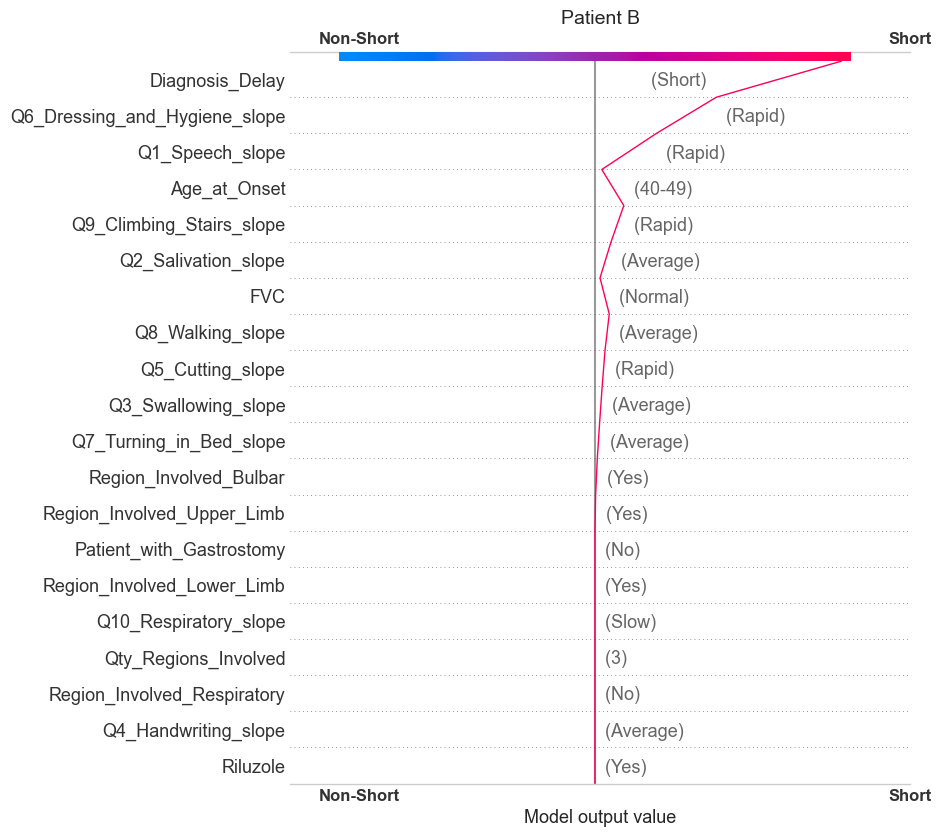

In [32]:
idx_patient_A = 27
idx_patient_B = 352


# ====================================
# DECISION PLOT FOR PATIENT A
# ====================================
fig, ax = plt.subplots(figsize=figsize_default)
shap.decision_plot(
    explanation.base_values,
    explanation.values[non_short_indexes.index[idx_patient_A]],
    X_decoded_cleaned.iloc[idx_patient_A],
    feature_names=feature_names,
#     feature_order='none',
    show=False,
)

utils.customize_xticks(ax=ax, fontsize=12)

plt.title('Patient A', fontsize=14)

plt.grid(False)
# plt.tight_layout()

utils.save_plot(
    plt=plt, 
    folder='saved_graphs', 
    file_name='patient_A_decision_plot', 
    save_in_pdf_format=True,
)

plt.show()


# ====================================
# DECISION PLOT FOR PATIENT B
# ====================================
fig, ax = plt.subplots(figsize=figsize_default)
shap.decision_plot(
    explanation.base_values,
    explanation.values[idx_patient_B],
    X_decoded_cleaned.iloc[idx_patient_B],
    feature_names=feature_names,
#     feature_order='none',
    show=False,
)

utils.customize_xticks(ax=ax, fontsize=12)

plt.title('Patient B', fontsize=14)

plt.grid(False)

utils.save_plot(
    plt=plt, 
    folder='saved_graphs', 
    file_name='patient_B_decision_plot', 
    save_in_pdf_format=True,
)

plt.show()





# Plot SHAP Decision for both patients ($A$ and $B$)


xticks values: [-0.6 -0.4 -0.2  0.   0.2  0.4  0.6  0.8  1.   1.2]
xticks modif.: ['', 'Non-Short', '', '', '', '', '', '', '', 'Short']


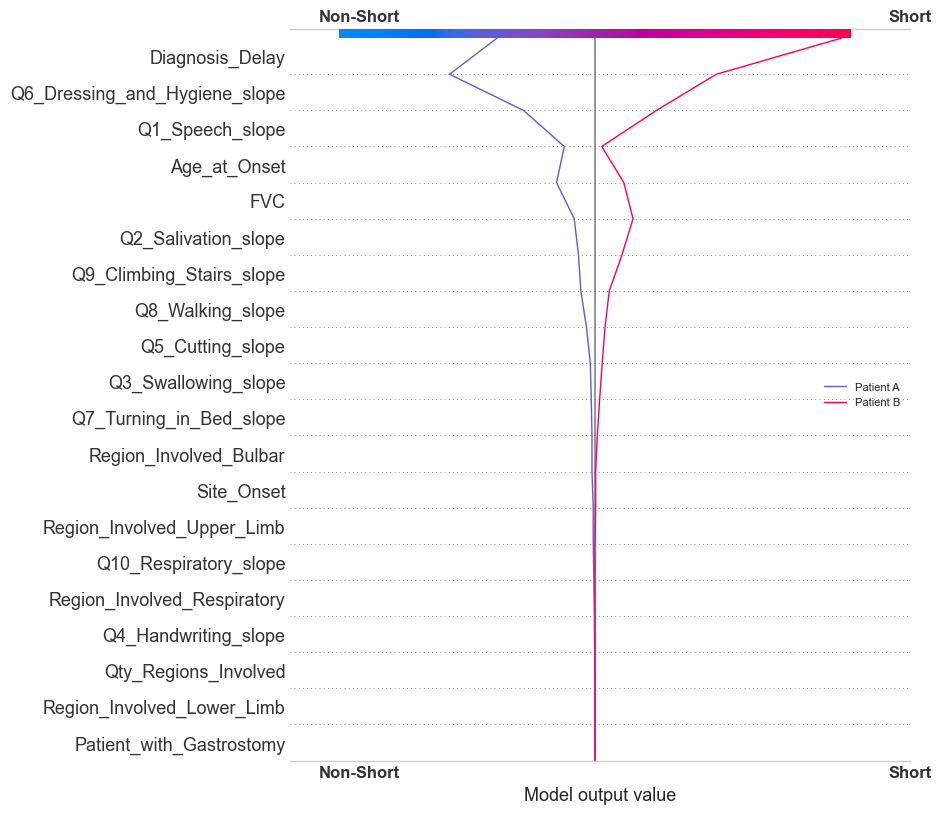

In [34]:
# plot both patients

data_shap = np.array([
    explanation.values[idx_patient_A],
    explanation.values[idx_patient_B],
])

fig, ax = plt.subplots(figsize=figsize_default)

plt.legend(['Patient A', 'Patient B'], fontsize=12)

# for row in data_shap:
shap.decision_plot(
    explanation.base_values,
    data_shap, 
#     X_decoded_cleaned.iloc[short_indexes.index[0]],
    feature_names=feature_names,
    show=False,
#         link='logit'
#     highlight=1,
    legend_labels=['Patient A', 'Patient B'],
    legend_location='center right',
    # legend_fontsize=14,
    
)

utils.customize_xticks(ax=ax, fontsize=12)

# ax.set_xticks(x_ticks_default, x_ticks_default_labels, fontweight='bold', fontsize=14)
# ax.set_yticks(ax.get_yticks(), fontsize=8, fontweight='bold')

plt.grid(False)

# print(ax.legend())


utils.save_plot(
    plt=plt, 
    folder='saved_graphs', 
    file_name='comparing_patient_A_and_B_decision_plot', 
    save_in_pdf_format=True,
)

plt.show()


# Plot Beeswarm for all patients


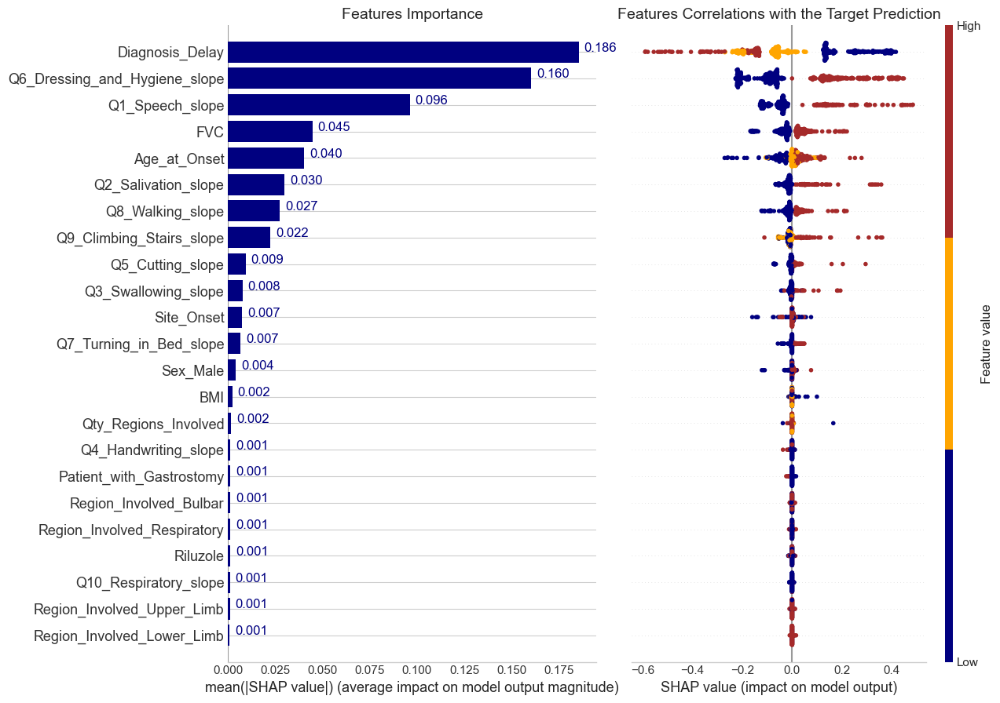

In [39]:
# plot both patients

fig = plt.figure(figsize=(15,5))

# ax1 = plt.subplot2grid(shape=(1, 3), loc=(0, 0))

ax1 = fig.add_subplot(121)


# Bar plot
shap.summary_plot(
    explanation, 
    X_valid, 
    max_display=max_display,
    plot_type="bar",
    show=False,
    color='navy',
    # midline_decimal_point=False,

)
# ax1.title.set_text('Absolute Feature Impact', fontdict={'fontsize':12})
ax1.set_title('Features Importance', fontdict={'fontsize':14})



utils.annotate_barplot(
    ax=ax1, 
    midline_decimal_point=False, 
    font_size=12,
    deslocate=0.15,
    color='navy'
)
ax1.grid(axis='x')

# Beeswarm plot
ax2 = fig.add_subplot(122)
# ax2 = plt.subplot2grid(shape=(1, 3), loc=(0, 1), colspan=2)

# colors = mcp.gen_color(cmap='tab20', n=3)
colors = ListedColormap(['navy', 'orange', 'brown'])


shap.summary_plot(
    explanation, 
    X_valid, 
    max_display=max_display,
    show=False,
    plot_size=(13,9),
    cmap=colors,
    # midline_decimal_point=False,
)
# ax2.title.set_text('Distribution')
ax2.set_title('Features Correlations with the Target Prediction', fontdict={'fontsize':14})


ax2.get_yaxis().set_visible(False)

ax2.get_yaxis().set_label_text('')
# ax2.get_yaxis().title('')



plt.tight_layout()
plt.grid(False)

# plt.savefig(
#     f'saved_graphs/SHAP_0_Feature_Importance_and Beeswarm.png', 
#     bbox_inches='tight', 
#     dpi=300
# )

utils.save_plot(
    plt=plt, 
    folder='saved_graphs', 
    file_name='SHAP_0_Feature_Importance_and_Beeswarm', 
    save_in_pdf_format=True,
)


plt.show()


# Plot the model $output$ $impact$ for each $value$ of each $feature$

---------------
Diagnosis_Delay
---------------


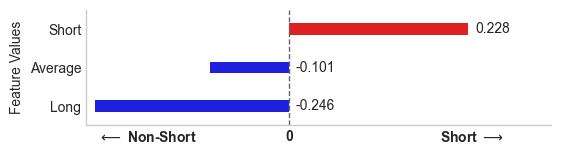

------------
Age_at_Onset
------------


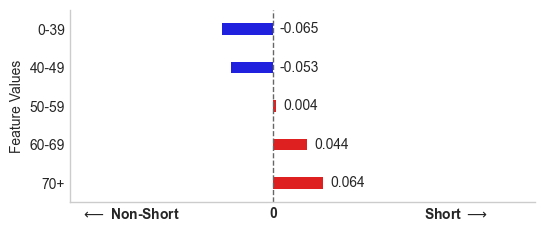

----------
Site_Onset
----------


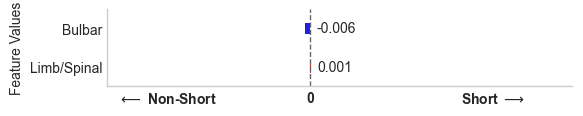

--------
Riluzole
--------


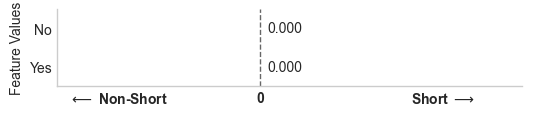

In [45]:
# explanation_cohort = shap.Explanation(
#     np.round(shap_values, 3), 
#     base_values=base_value,
#     feature_names=feature_names,
# #     data = X_valid.values,
#     data = X_decoded.values,
# )

explanation_cohort = explanation

# print(explanation_cohort)

dfs = []

min_shap_value = 0.0
max_shap_value = 0.0

for ind_feat, feat in enumerate(feature_names):

    # get cohort for the feature
    cohort = explanation_cohort.data[:, ind_feat]

    # get cohort-shap-values for the feature-cohort
    cohort_shap_values = explanation_cohort.cohorts(cohort)

    
    # get feature values description
    feat_values = []
    feat_values_aux = cohort_shap_values.cohorts.keys()
    for f_value in feat_values_aux:
        try:
            feat_values.append(f_value.split(')')[1].strip())
        except: 
            feat_values.append(f_value)
    
    
    # store feature values SHAP-values
    feat_shap_values = []

    # for each value of the feature
    for key in feat_values_aux:
        # get shap-values for feature-value
        shaps_key = cohort_shap_values.cohorts[key]
        # calculate the mean of the shap-values
        shaps_key_mean = np.round(shaps_key[:, ind_feat].values.mean(), 3)
        # store mean shap-value for the feature-value
        feat_shap_values.append(shaps_key_mean)

    
    # create DataFrame with the SHAP data
    data = {
        'Feature Values': feat_values,
        'mean(SHAP value) by feature values': feat_shap_values,
    }
    df = pd.DataFrame(data)

    # if feat == 'Diagnosis_Delay':
    #     df['Feature Values'] = df['Feature Values'].replace({'Long': 'Short', 'Short': 'Long'})
    
    # store the DataFrames created by each feature
    dfs.append([feat, len(feat_values), df])
    
    # store the min and max overall shap-value
    min_shap_value = np.min([min_shap_value, np.min(feat_shap_values)])
    max_shap_value = np.max([max_shap_value, np.max(feat_shap_values)])

# display(dfs)   



mask = np.abs(explanation.values).mean(0).argsort()[::-1]
features_ordered_names = X_decoded_cleaned.columns[mask]


folder_to_save = os.path.abspath('saved_graphs')

i = 0
for feat_ordered in features_ordered_names:
    i+=1

    # PLOT THE GRAPHS ordered inversed by mean SHAP value
    for feat, qty_values, df in dfs:    
        if (feat == feat_ordered):
            utils.print_string_with_separators(feat)

            if feat == 'Diagnosis_Delay': 
                df['order'] = df['Feature Values']
                df.order = df.order.replace({'Long': 3, 'Average': 2, 'Short': 1})
                df.sort_values(by=['order'], inplace=True)

#             display(df)    
                
            utils.plot_shap_values_by_feature(
                    data=df, 
                    title=f'{feat}', # \n mean(|SHAP value|) = {feat_shap_mean}',
                    figsize=[6,(qty_values / 2)],
                    bar_height=0.3,
                    x_min=min_shap_value,
                    x_max=max_shap_value,
                    feature_name=f'{i:02d}_{feat}',
                    midline_decimal_point=False,
                    folder_to_save=folder_to_save,
                )

    

---
---
---
---
---
# OTHER TESTS
---
---
---
---
---

# Plot Waterfall graphs for both patients

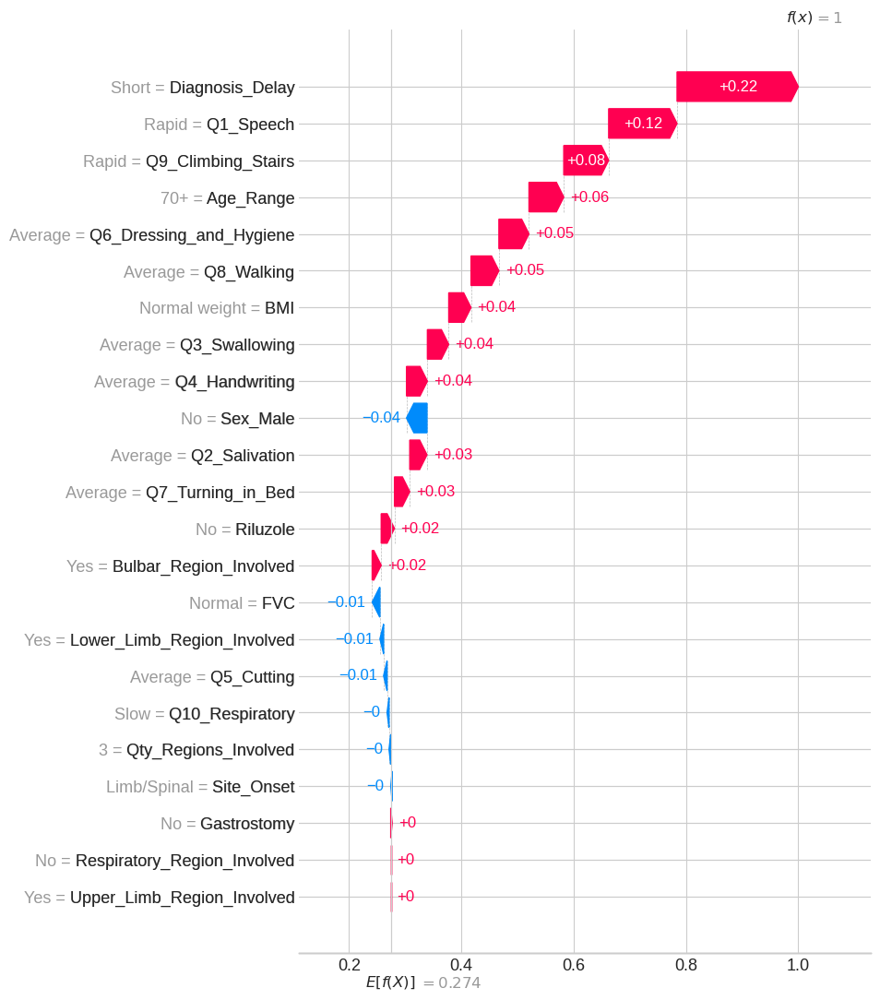

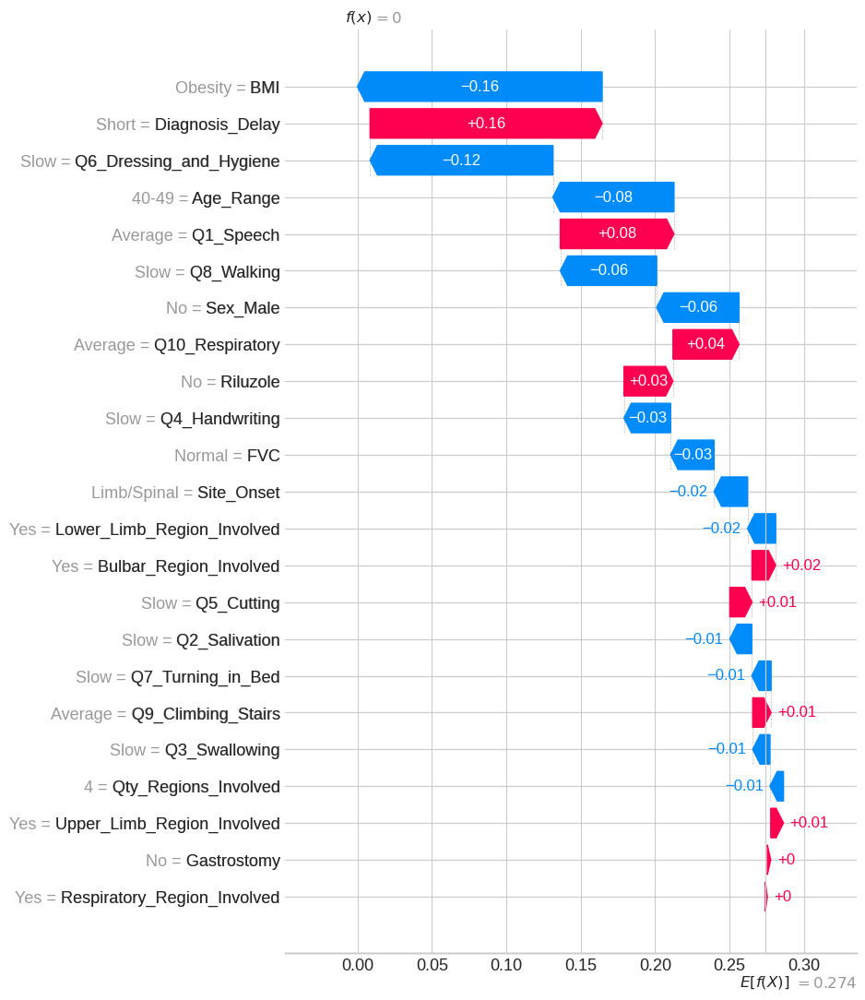

In [33]:

for ind in samples_to_plot: #[short_indexes.index[0], non_short_indexes.index[0]]:
    shap.waterfall_plot(
        explanation[ind],
        show=False,
        max_display=max_display,
    )
#     plt.xticks(x_ticks_default, x_ticks_default_labels)
    plt.grid(False)
    plt.show()




---
---
---
# O T H E R  -    T E S T S

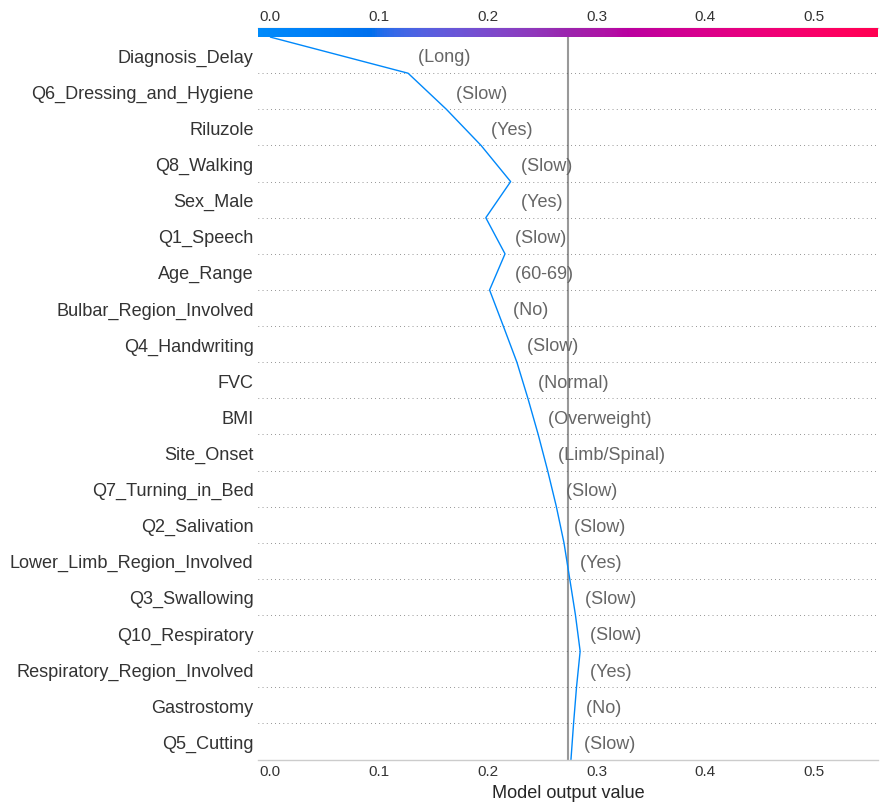

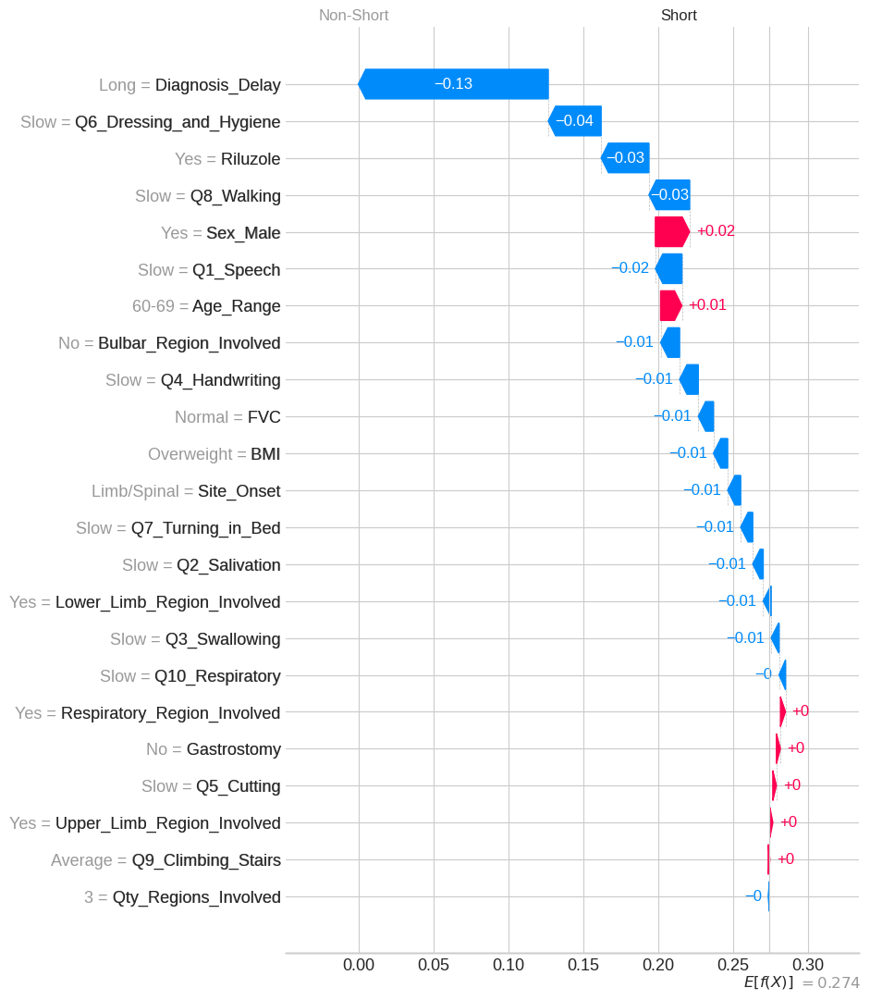

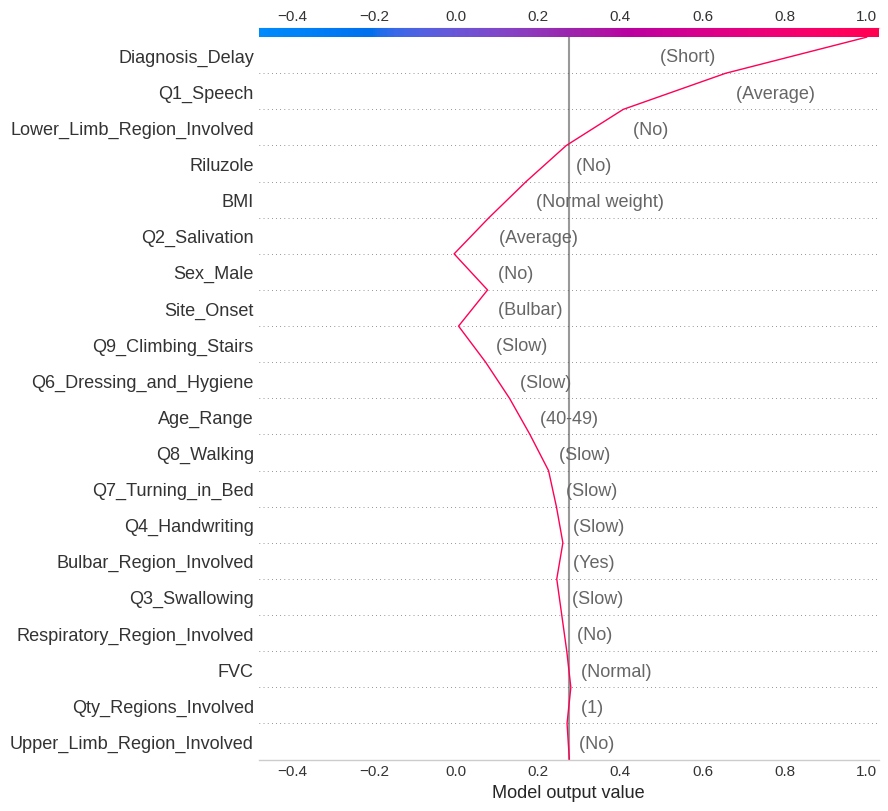

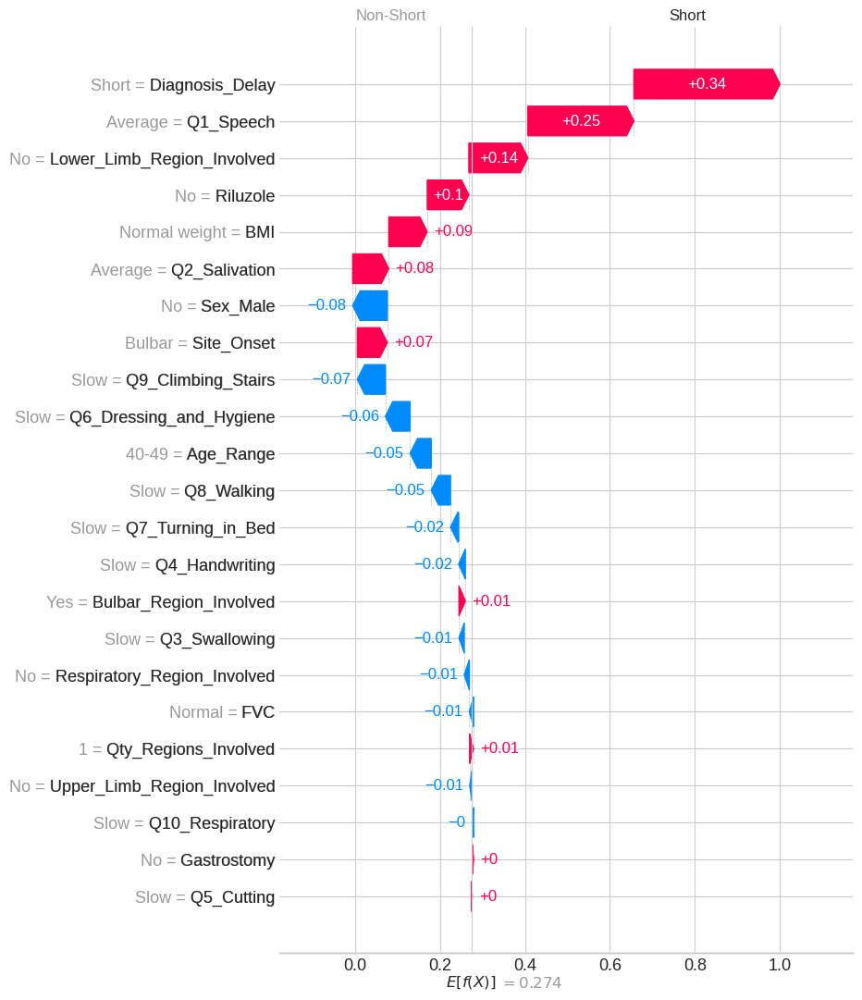

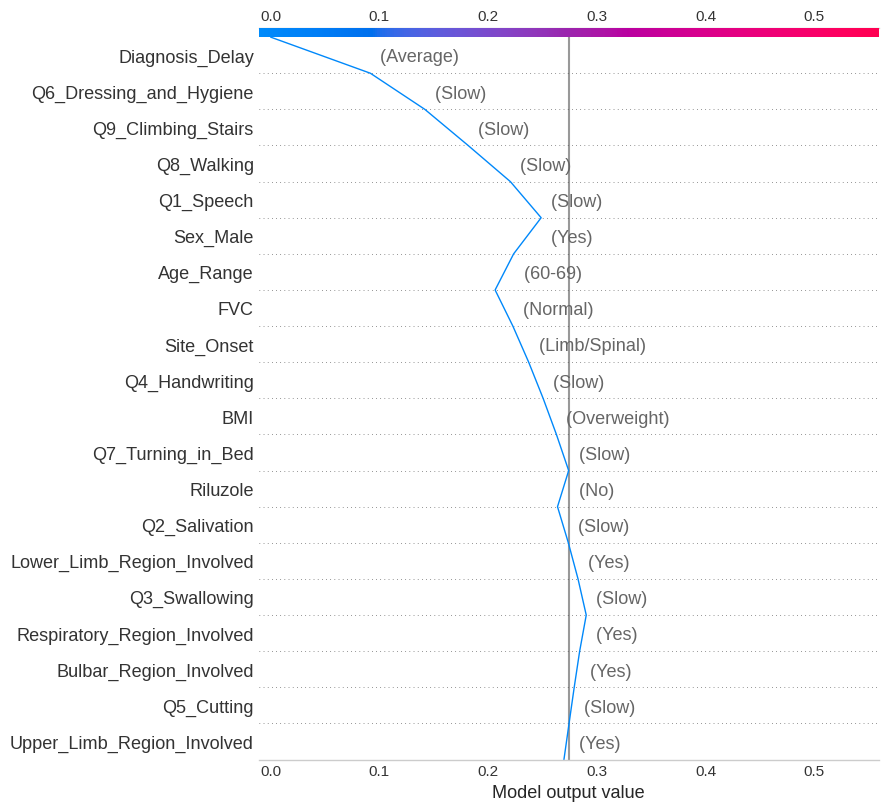

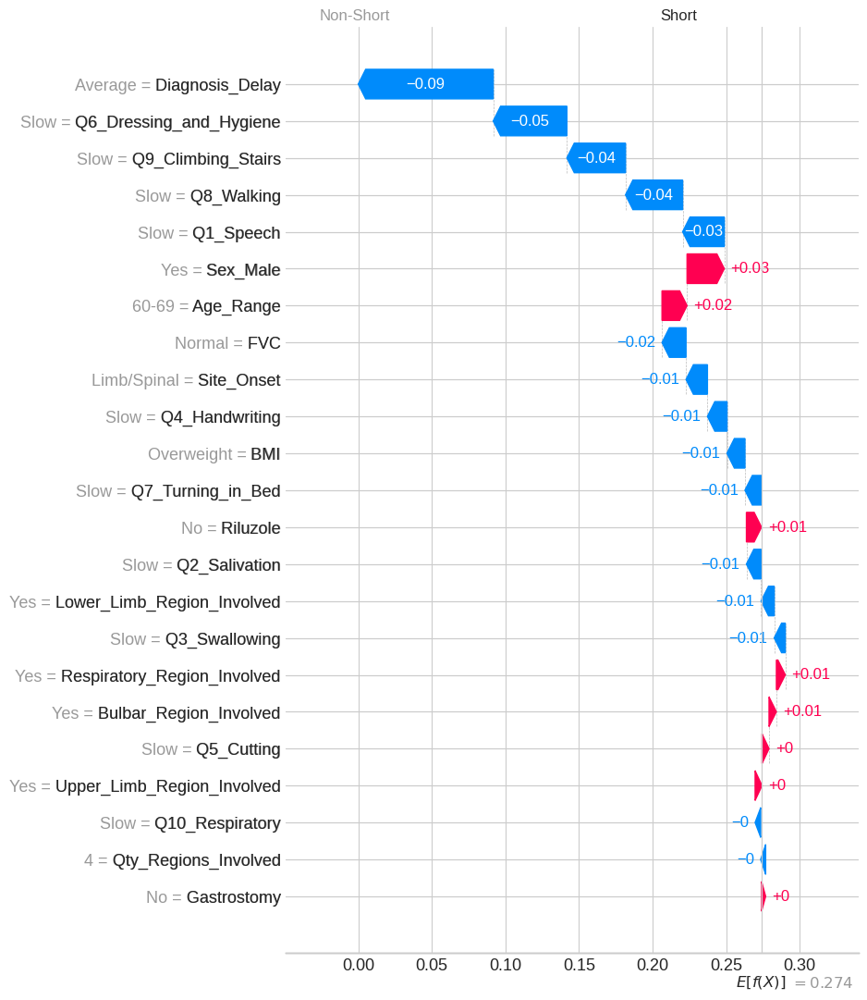

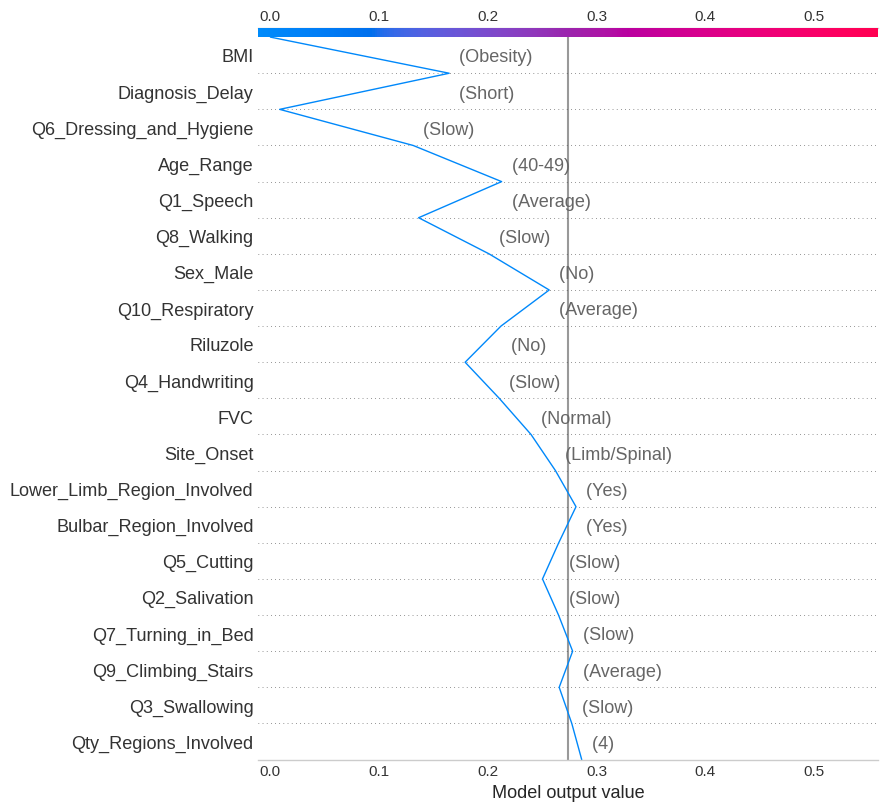

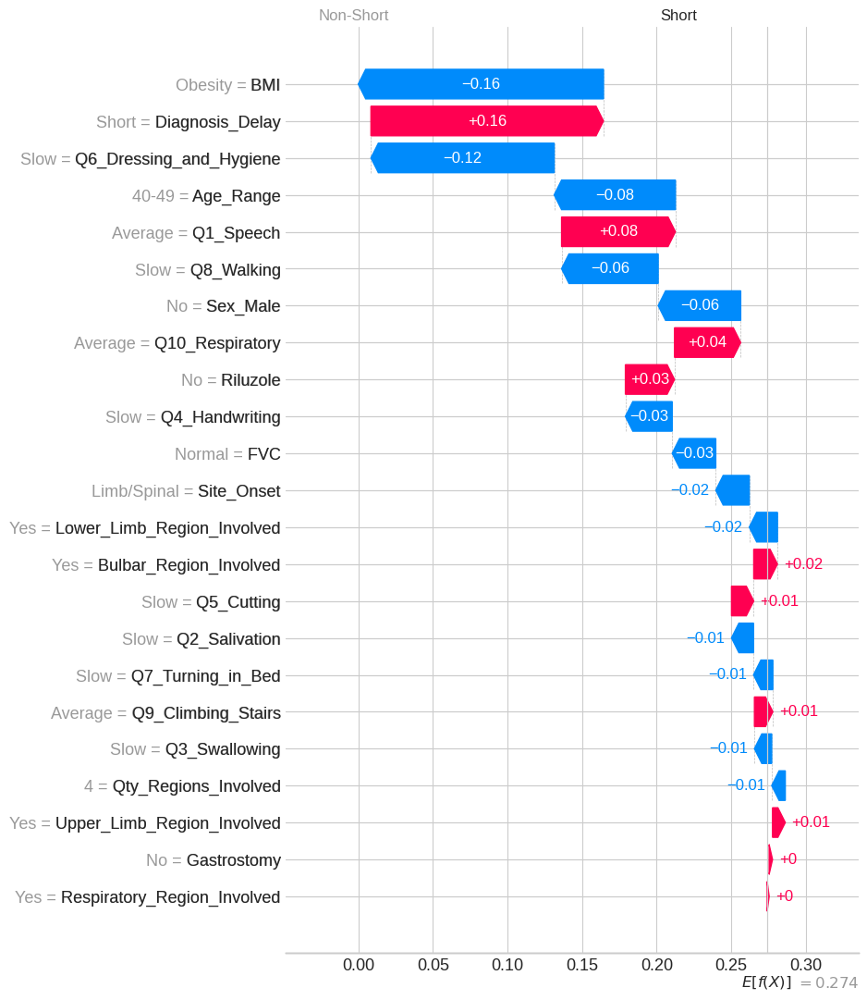

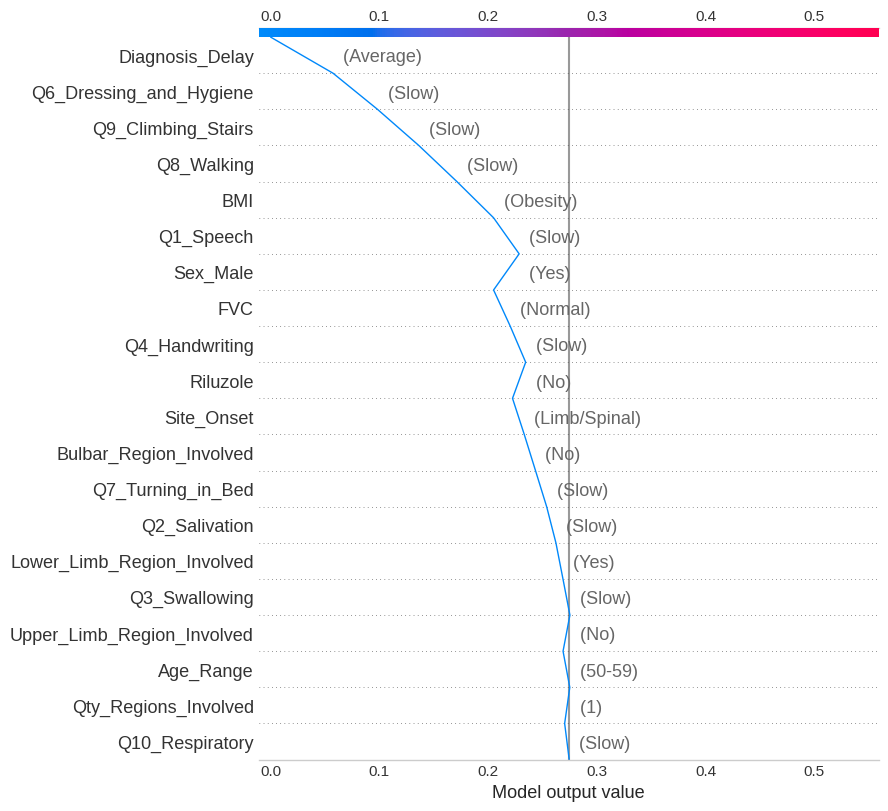

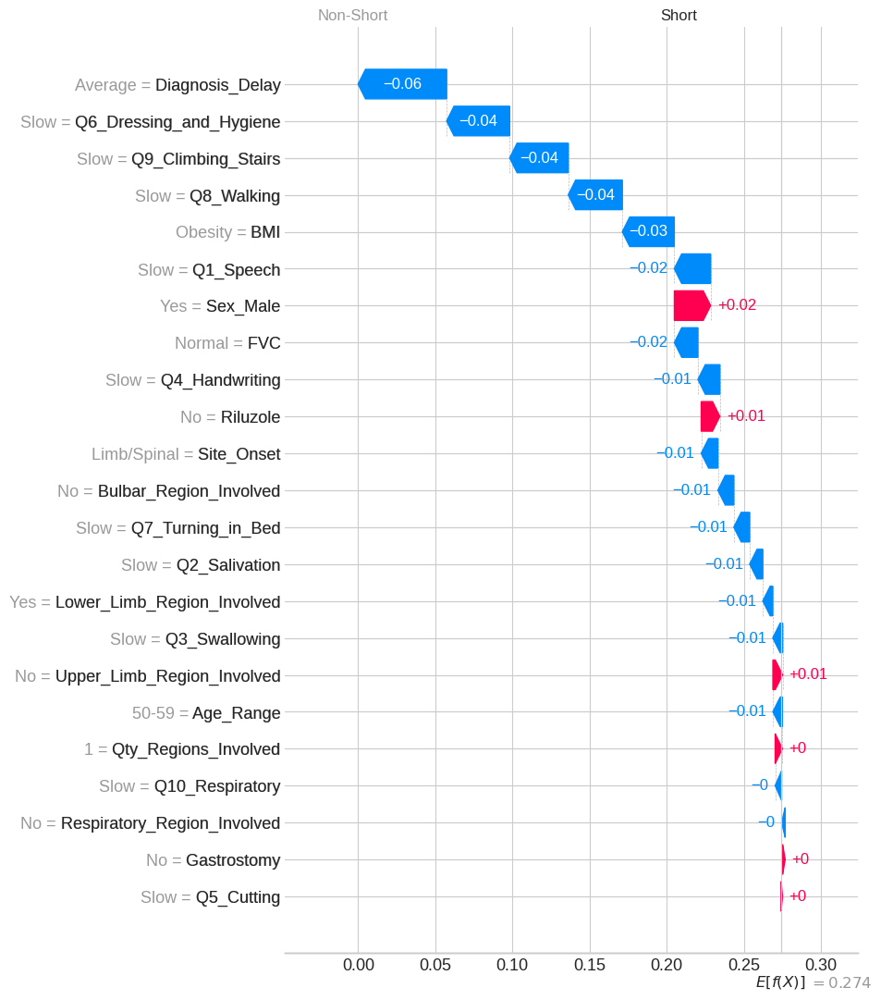

In [34]:
# plt.figure(figsize=figsize_default)


start = 0
qty = 3
shap_values_short = shap_values[short_indexes.index][start:start+qty]
shap_values_non_short = shap_values[non_short_indexes.index][start:start+qty]


samples_to_plot = np.concatenate((shap_values_short, shap_values_non_short))

s = 'SHORT'
for ind in non_short_indexes.index[0:5]: #[short_indexes.index[0], non_short_indexes.index[0]]:
    shap.decision_plot(
        explanation.base_values,
        explanation.values[ind],
        X_decoded_cleaned.iloc[ind],
        feature_names=feature_names,
#         feature_order='none',
        show=False,
    )

#     plt.xticks(x_ticks_default, x_ticks_default_labels)
    plt.grid(False)
#     plt.title(f'Patient {s}')
    plt.show()
    
    shap.waterfall_plot(
        explanation[ind],
        show=False,
        max_display=max_display,
    )
    plt.xticks(x_ticks_default, x_ticks_default_labels)
    plt.grid(False)
    plt.show()




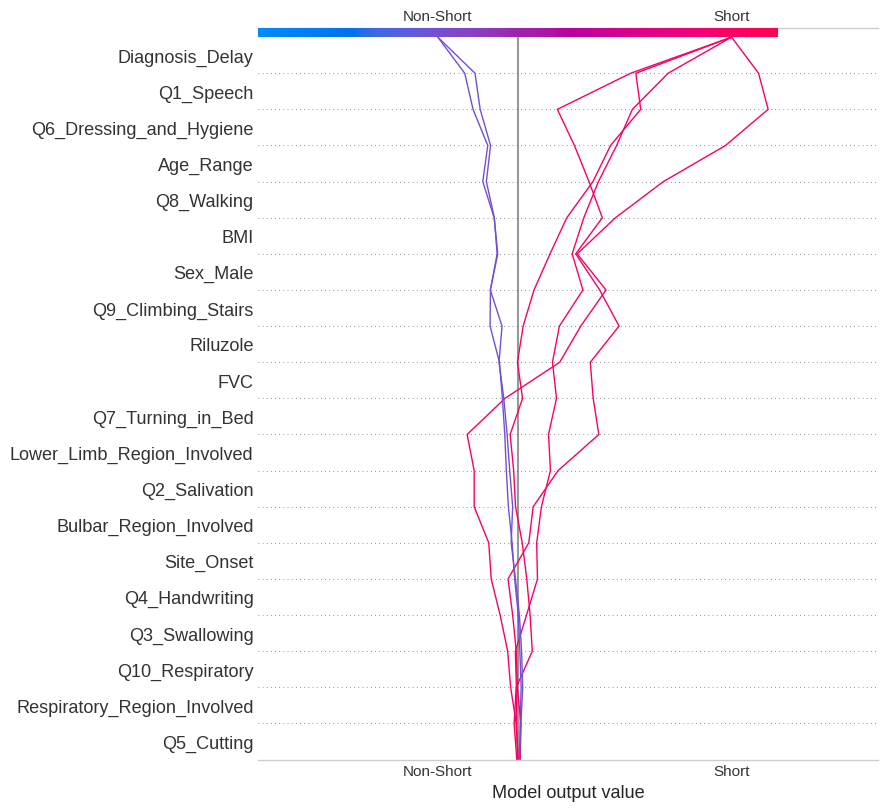

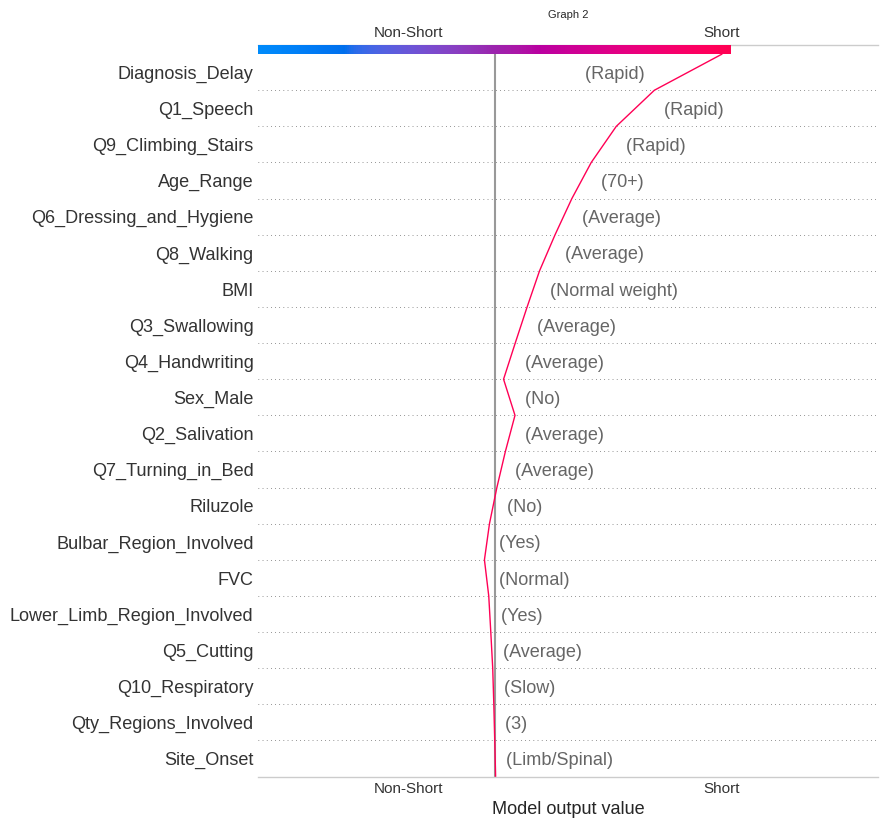

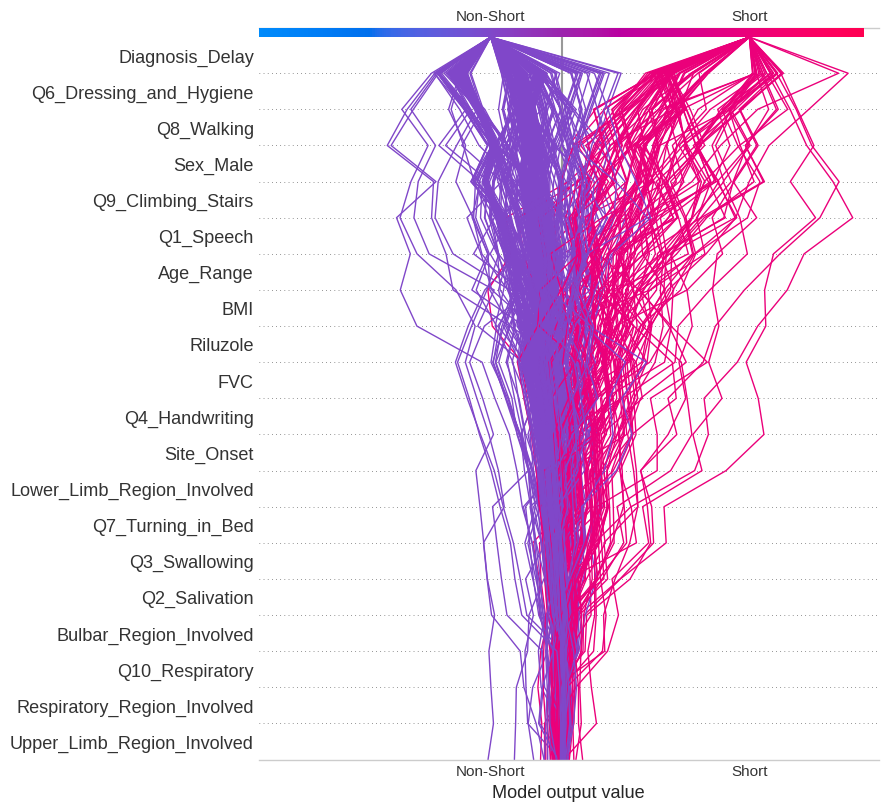

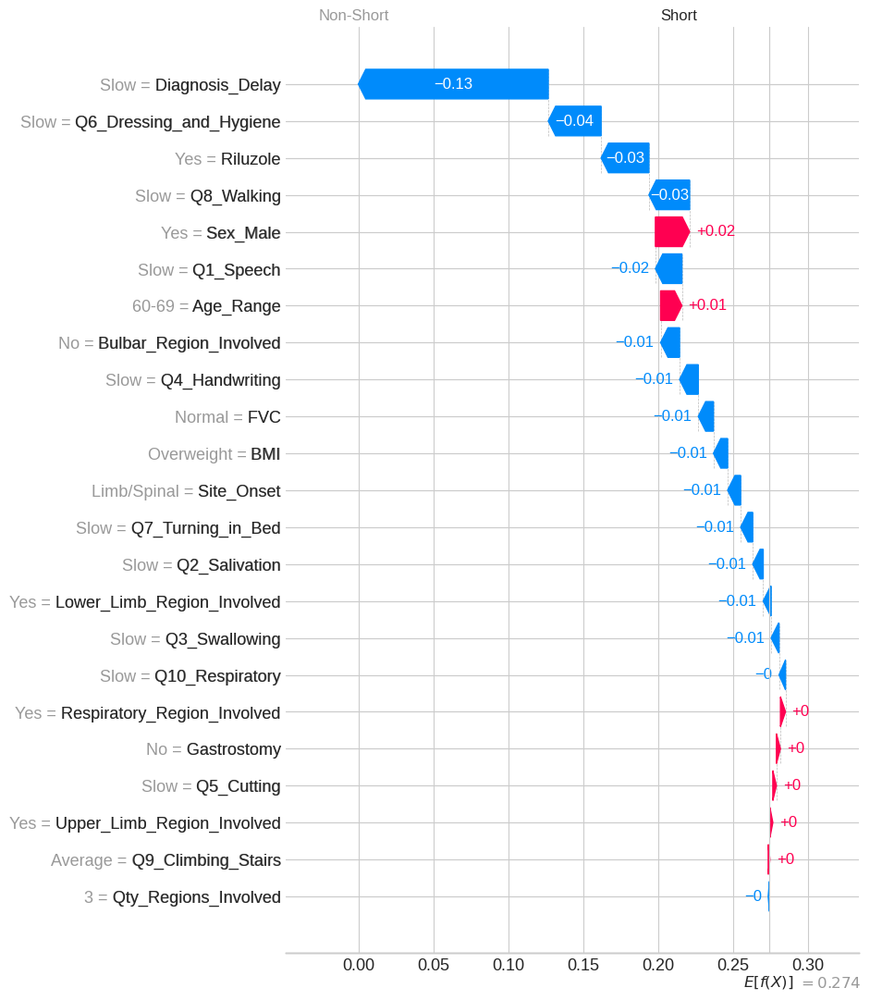

In [60]:
# plt.figure(figsize=figsize_default)


start = 0
qty = 3
shap_values_short = shap_values[short_indexes.index][start:start+qty]
shap_values_non_short = shap_values[non_short_indexes.index][start:start+qty]


samples_to_plot = np.concatenate((shap_values_short, shap_values_non_short))
shap.decision_plot(
    base_value=explanation.base_values,
    shap_values=samples_to_plot,
#     X_decoded_cleaned.iloc[samples_to_plot],
    feature_names=feature_names,
#     feature_order='none',
    show=False,
)
plt.xticks(x_ticks_default, x_ticks_default_labels)
plt.grid(False)
plt.show()

for ind in [short_indexes.index[0]]:#, 1, 55, 245]:
    shap.decision_plot(
        explanation.base_values,
        explanation.values[ind],
        X_decoded_cleaned.iloc[ind],
        feature_names=feature_names,
#         feature_order='none',
        show=False,
    )

plt.xticks(x_ticks_default, x_ticks_default_labels)
plt.grid(False)
plt.title('Graph 2')
plt.show()

shap.decision_plot(
    explanation.base_values,
    explanation.values,
#     X_decoded_cleaned.iloc[ind],
    feature_names=feature_names,
    show=False,
)
plt.xticks(x_ticks_default, x_ticks_default_labels)
plt.grid(False)
plt.show()


shap.waterfall_plot(
    explanation[0],
    show=False,
    max_display=max_display,
)
plt.xticks(x_ticks_default, x_ticks_default_labels)
plt.grid(False)
plt.show()



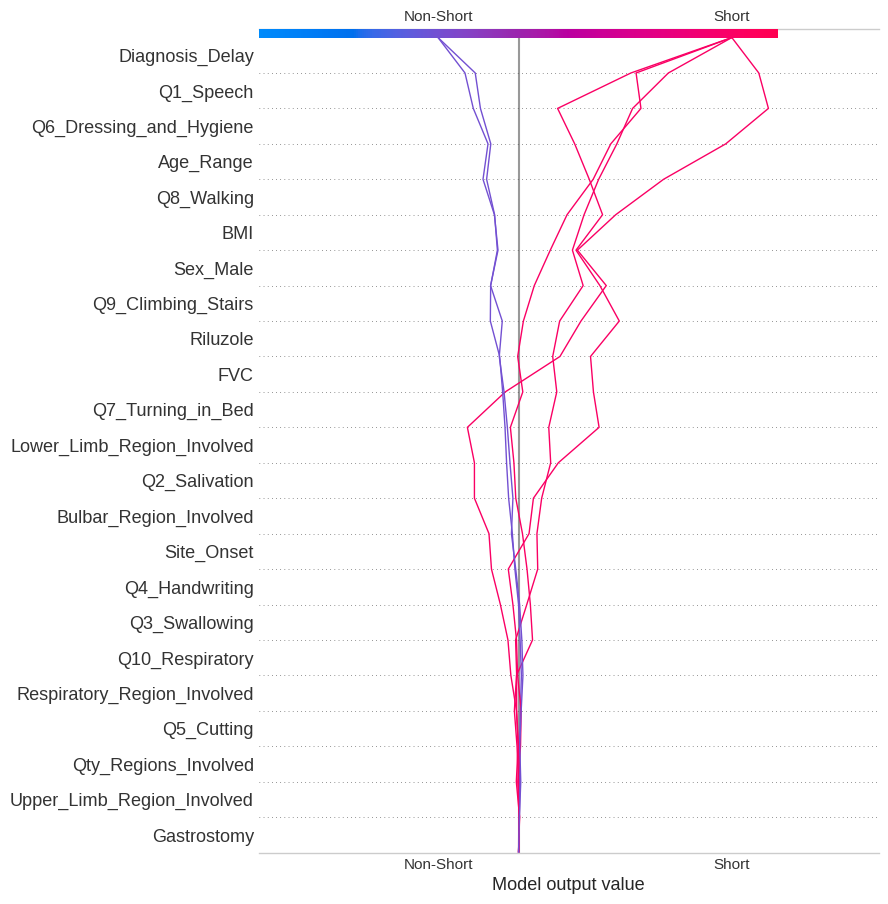

In [276]:

start = 0
qty = 3
shap_values_short = shap_values[short_indexes.index][start:start+qty]
shap_values_non_short = shap_values[non_short_indexes.index][start:start+qty]


samples_to_plot = np.concatenate((shap_values_short, shap_values_non_short))
# PLOT SOME SHORT-SURVIVAL ================================
shap.decision_plot(
    feature_names=feature_names,
    shap_values=samples_to_plot, 
    base_value=base_value,
    show=False,
    feature_display_range=display_range,
    plot_color=None, #'RdBl'    
) 

plt.xticks(x_ticks_default, x_ticks_default_labels)
plt.grid(False)
plt.show()


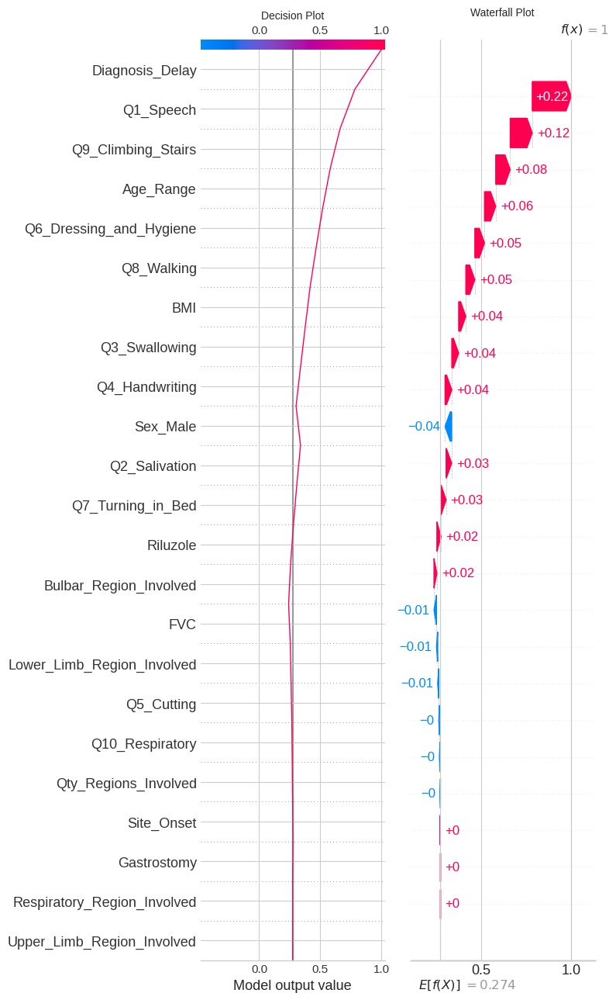

In [192]:
# display(explanation)


fig = plt.figure(figsize=(10,5))

ax1 = fig.add_subplot(121)

shap_val = shap_values[short_indexes.index][0]
shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_val, 
    base_value=base_value,
    show=False,
    feature_display_range=display_range,
    plot_color=None, #'RdBl'    
)    
ax1.title.set_text('Decision Plot')

ax2 = fig.add_subplot(122)
shap_val = explanation[short_indexes.index[0]]
shap.plots.waterfall(
    shap_val,
    max_display=max_display,
    show=False,
) 
ax2.title.set_text('Waterfall Plot')

ax2.get_yaxis().set_visible(False)


plt.tight_layout()
plt.show()


# max_display = 23
# display_range = slice(-1, -(max_display+1), -1)

# start = 0
# qty = 1
# shap_values_short = shap_values[short_indexes.index][start:start+qty]
# shap_values_non_short = shap_values[non_short_indexes.index][start:start+qty]

# # PLOT SOME SHORT-SURVIVAL ================================
# shap.decision_plot(
#     feature_names=feature_names,
#     shap_values=shap_values_short, 
#     base_value=base_value,
#     show=False,
#     feature_display_range=display_range,
#     plot_color=None, #'RdBl'    
# )    

# # PLOT SOME NON-SHORT-SURVIVAL ================================
# shap.decision_plot(
#     feature_names=feature_names,
#     shap_values=shap_values_non_short, 
#     base_value=base_value,
#     show=False,
#     feature_display_range=display_range,
#     plot_color=None, #'RdBl'    
# )    

# plt.xticks([-0.5, 0., 1., 1.5])

# plt.show()




## Plot the model $output$ $impact$ for each $value$ of each $feature$

In [6]:
def plot_shap_values_by_feature(data, title, x_min, x_max, feature_name, 
                                figsize=[5,2], bar_height = 0.1):
    
    plt.figure(figsize=figsize)
    
    # set colors according to positive and negatives values
    colors = ['red' if x >= 0 else 'blue' for x in data[data.columns[1]].values]
    
    ax = sns.barplot(
        data=data, 
        x=data.columns[1], 
        y=data.columns[0],
        palette=colors # sns.color_palette("colorblind"),
    )
    
      
    # annotate the bars with their values
    for p in ax.patches:
        
        x_offset = p.get_width() if p.get_width() > 0 else 0 
         
        ax.annotate(
            "%.3f" % p.get_width(), 
            xy=(
                x_offset, 
                p.get_y()+p.get_height()/2
            ),
            xytext=(5, 0), 
            textcoords='offset points', 
            ha="left", 
            va="center",
            size=9,
        )    

        # adjust bar width (or height)
        diff = p.get_height() - bar_height

        # we change the bar width
        p.set_height(bar_height)

        # we recenter the bar
        p.set_y(p.get_y() + diff * 0.5)    
        
    
    mult = 1.5
    x_min = np.round(x_min * 1.05, 3)
    x_max = np.round(x_max * 1.3, 3)
    
    plt.xlim(x_min, x_max)


    ax.set_xlabel('Model Output Impact', fontsize=10, fontweight='bold')
    
    ax.grid(False)
    plt.axvline(x=0.0, color='#666666', lw=1, ls='--')


    plt.xticks([x_min, (x_min*0.7), 0, (x_max*0.7), x_max], 
               fontweight='bold',
              fontsize=10)
    ax.set_xticklabels([' ', '$\longleftarrow$ Non-Short', 0, 'Short $\longrightarrow$', ' ' ])


#     plt.title(title, fontsize=12, fontweight='bold')
    
    
    plt.savefig(
        f'saved_graphs/SHAP_by_feature_values_{feature_name}.png', 
        bbox_inches='tight', 
#         pad_inches=2,
        dpi=300
    )

    plt.show()
    
    plt.close()


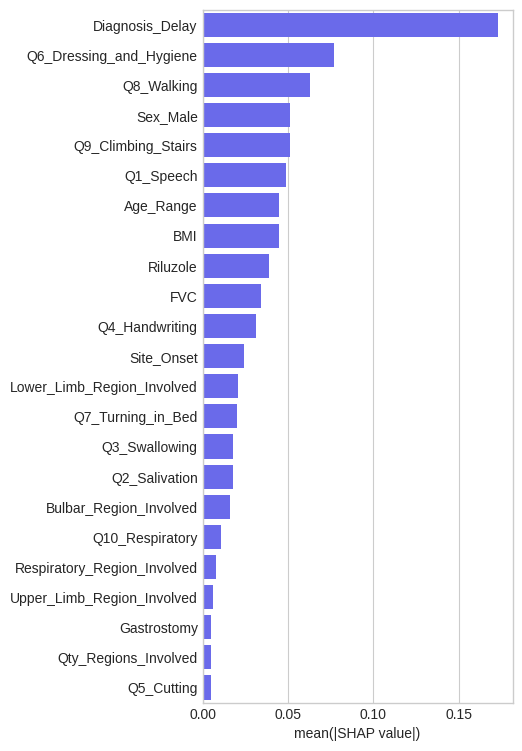

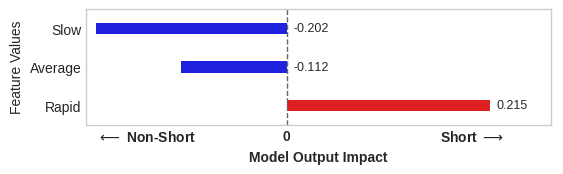

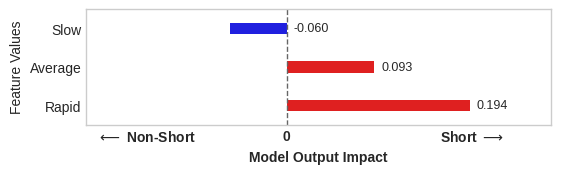

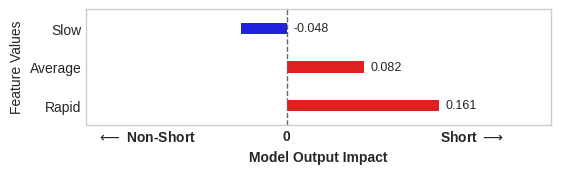

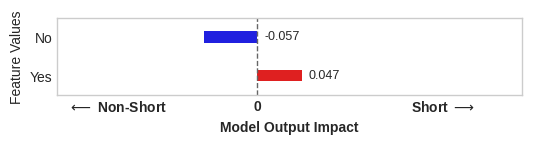

...

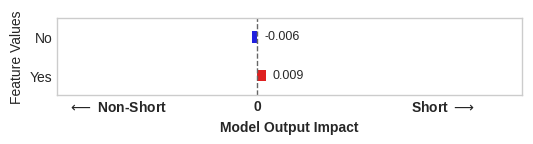

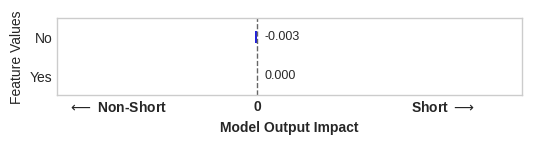

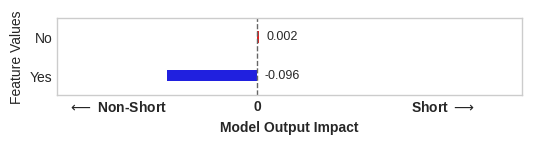

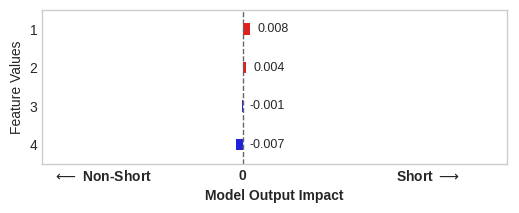

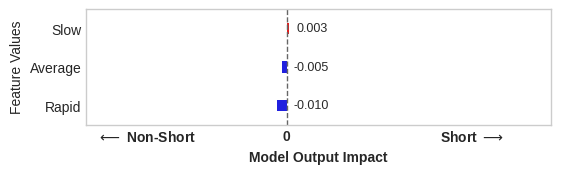

In [7]:
dfs = []

min_shap_value = 0.0
max_shap_value = 0.0

for i, feat in enumerate(feature_names):
    
    # get feature values description
    feat_values = [] #list(cohort_shap_values.cohorts.keys())
    # store feature values SHAP-values
    feat_shap_values = []

#     print(i, feat)

    cohort = X_decoded[feat].values

    cohort_shap_values = explanation.cohorts(cohort).mean(0)
   
    for feat_value in cohort_shap_values.cohorts.keys():
        try:
            feat_values.append(feat_value.split(')')[1].strip())
        except: 
            feat_values.append(feat_value)
        # get SHAP-value for the feature value, and store
        shap_val = np.round(cohort_shap_values.cohorts[feat_value].values[i], 3)
        feat_shap_values.append(shap_val)
    
   
    # create DataFrame with the SHAP data
    data = {
        'Feature Values': feat_values,
#         'Mean SHAP values by feature values': feat_shap_values,
        'mean(SHAP value) by feature values': feat_shap_values,
    }
    
    df = pd.DataFrame(data)
    dfs.append([feat, len(feat_values), df])
    
    min_shap_value = np.min([min_shap_value, np.min(feat_shap_values)])
    max_shap_value = np.max([max_shap_value, np.max(feat_shap_values)])
  



mask = np.abs(shap_values).mean(0).argsort()[::-1]
mean_values = np.abs(shap_values).mean(0)

features_ordered_names = X_decoded.columns[mask]
features_ordered_shap_values = np.round(mean_values[mask], 3)


data = {
    'Feature': features_ordered_names,
    'mean(|SHAP value|)': features_ordered_shap_values,
}

df_feature_importance = pd.DataFrame(data)

# display(df_feature_importance)

# Bar plot (such as Feature Importance)
plt.figure(figsize=[4, 9])
ax = sns.barplot(
    data=df_feature_importance, 
    x=df_feature_importance.columns[1], 
    y=df_feature_importance.columns[0],
    palette=['#5555FF' for x in features_ordered_names],
)

ax.set_ylabel('')
# ax.set_xlabel('Average Impact on Model Output \n mean(|SHAP value|)', fontsize=10, )
# plt.title('Average Impact on Model Output for each Feature', fontsize=12, fontweight='bold')
plt.show()



i=0


for feat_ordered, feat_shap_mean in zip(features_ordered_names, features_ordered_shap_values):
    i+=1
    # PLOT THE GRAPHS ordered inversed by mean SHAP value
    for feat, qty_values, df in dfs:    
        if (feat == feat_ordered):
            plot_shap_values_by_feature(
                data=df, 
                title=f'{feat}', # \n mean(|SHAP value|) = {feat_shap_mean}',
                figsize=[6,(qty_values / 2)],
                bar_height=0.3,
                x_min=min_shap_value,
                x_max=max_shap_value,
                feature_name=f'{i:02d}_{feat}',
            )
    
    
    


In [35]:
xz = shap_values[short_indexes.index][0]

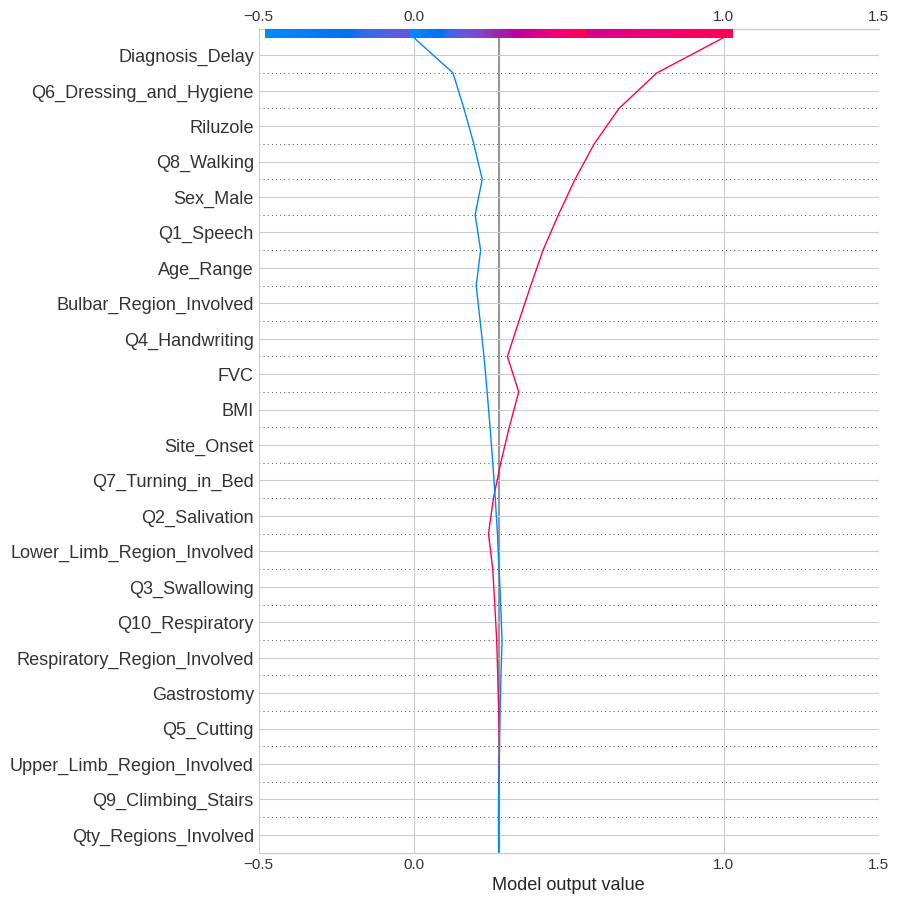

In [166]:
max_display = 23
display_range = slice(-1, -(max_display+1), -1)

start = 0
qty = 1
shap_values_short = shap_values[short_indexes.index][start:start+qty]
shap_values_non_short = shap_values[non_short_indexes.index][start:start+qty]

# PLOT SOME SHORT-SURVIVAL ================================
shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_values_short, 
    base_value=base_value,
    show=False,
    feature_display_range=display_range,
    plot_color=None, #'RdBl'    
)    

# PLOT SOME NON-SHORT-SURVIVAL ================================
shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_values_non_short, 
    base_value=base_value,
    show=False,
    feature_display_range=display_range,
    plot_color=None, #'RdBl'    
)    

plt.xticks([-0.5, 0., 1., 1.5])

plt.show()




## Plot model output impact for each value of each feature

In [169]:
# explanation[0, 'Sex_Male'].data


cohort = ['Non-Short' if df_y_valid.iloc[i].Class == 0 else 'Short' for i in range(rows_total)]
# display(cohort)
cohort_shap_values = explanation.cohorts(cohort).abs.mean(0)
# display(cohort_shap_values.values)
shap.plots.bar(
    cohort_shap_values,
    max_display=max_display,
    show=False,
)
plt.title(feat)
plt.show()



AttributeError: 'float' object has no attribute 'shape'

## Other Plots

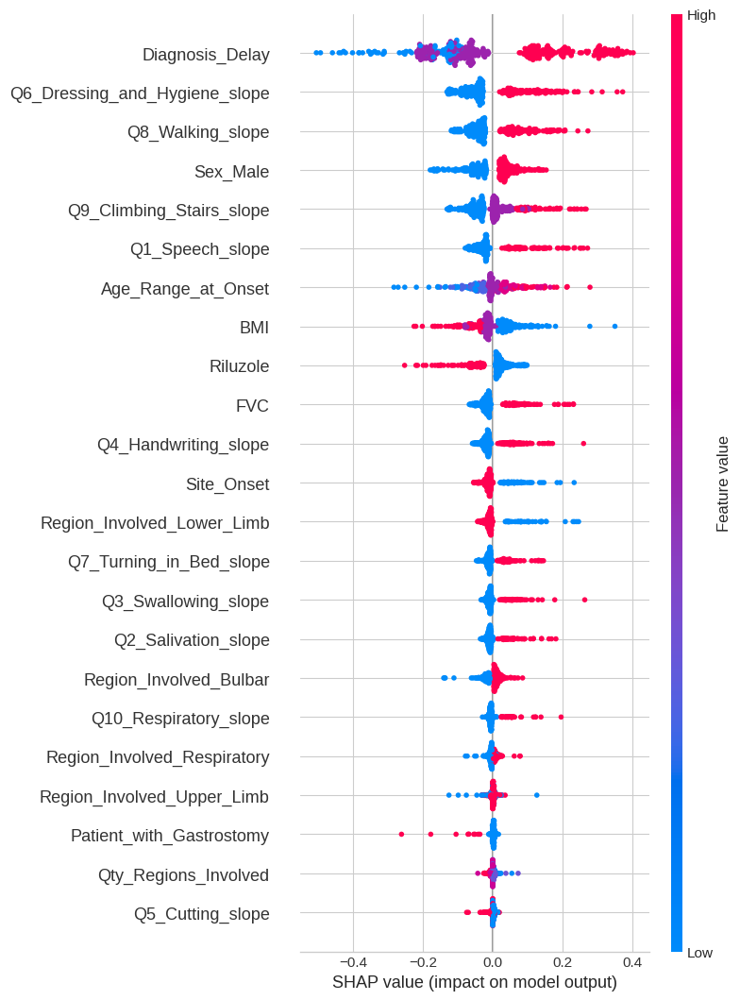

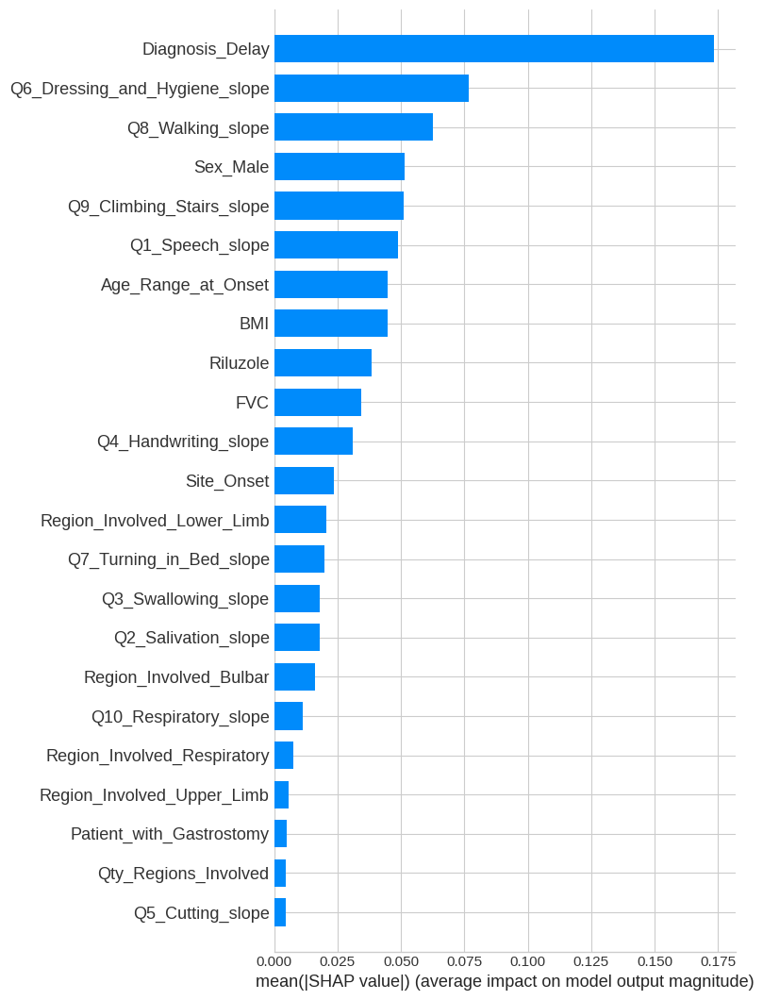

In [170]:
# Beeswarm plot
shap.summary_plot(
    shap_values, 
    X_valid, 
    max_display=max_display,
    show=False,
)
plt.show()

# Bar plot (such as Feature Importance)
shap.summary_plot(
    shap_values, 
    X_valid, 
    plot_type="bar",
    max_display=max_display,
    show=False,
)
plt.show()



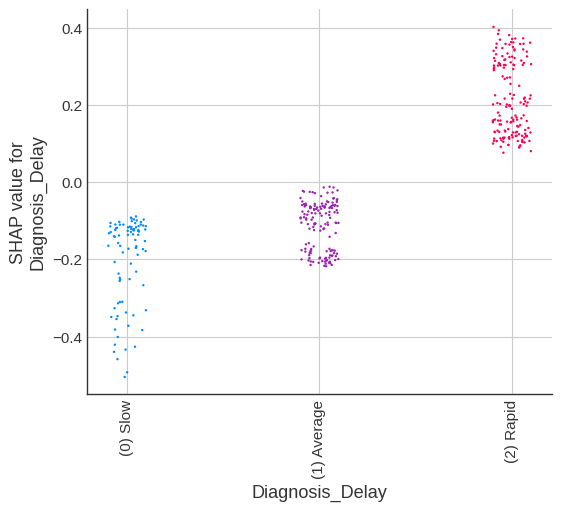

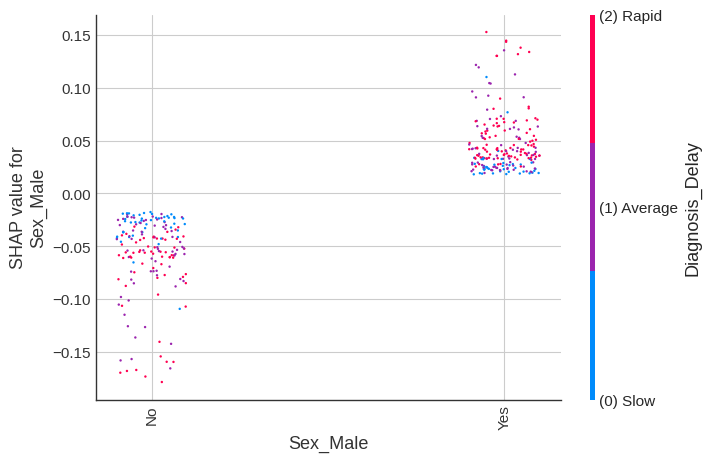

In [171]:
shap.dependence_plot(
    'Diagnosis_Delay', 
    shap_values, 
    X_decoded,
    interaction_index=0,
    feature_names=feature_names,
    x_jitter=x_jitter,
    dot_size=dot_size,
)


shap.dependence_plot(
    'rank(3)', 
    shap_values, 
    X_decoded,
    feature_names=feature_names,
    x_jitter=x_jitter,
    dot_size=dot_size,
)



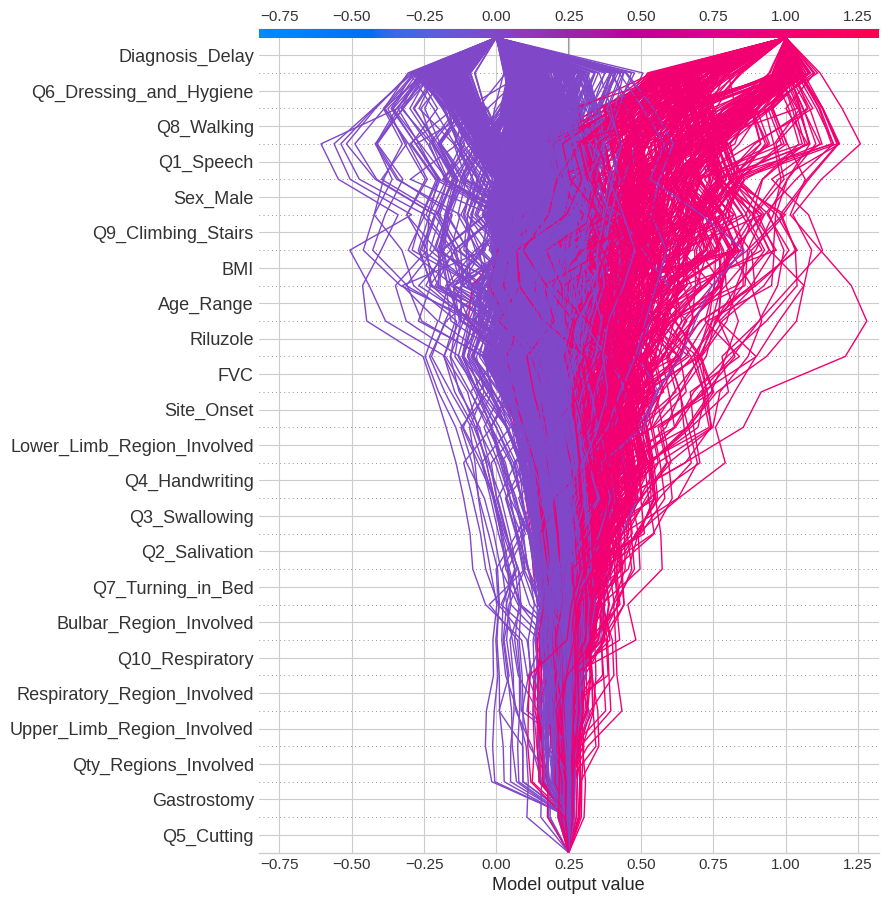

--------
Beeswarm
--------


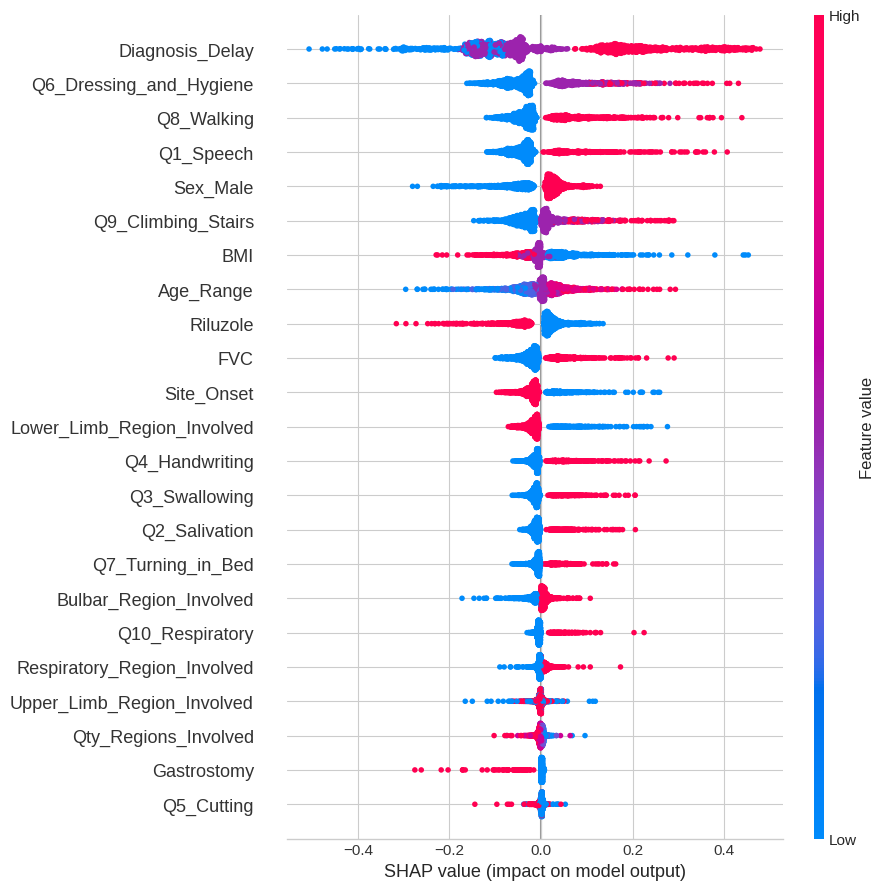

---------
Mean SHAP
---------


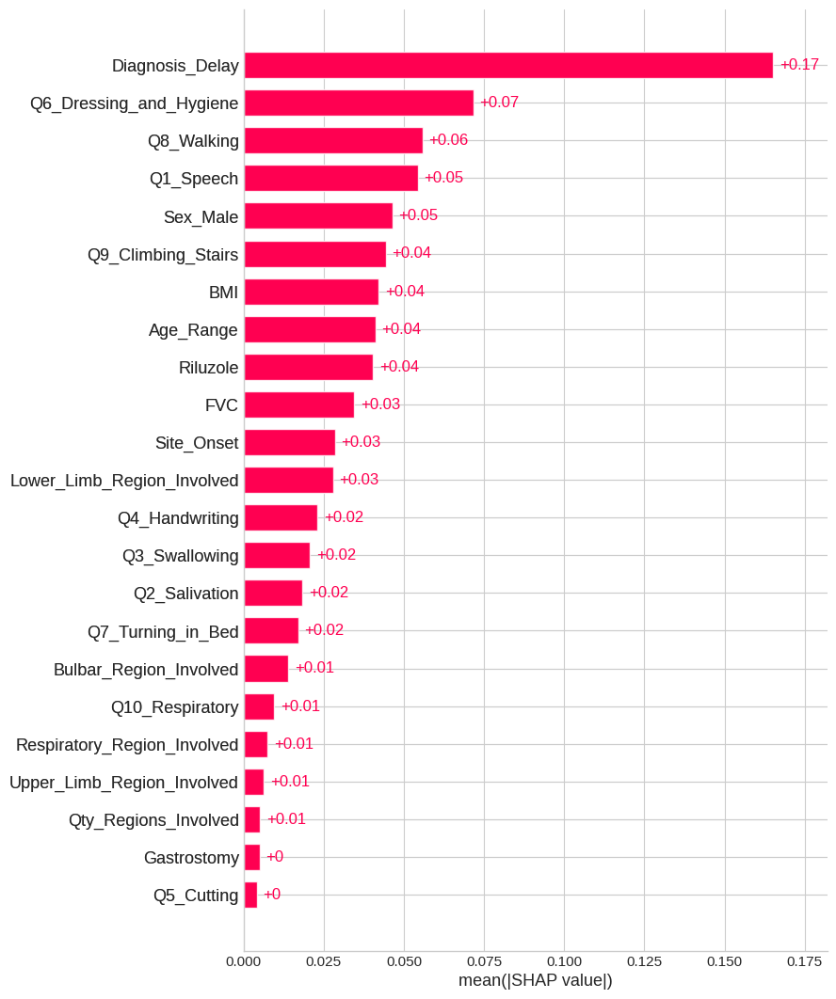

In [15]:
max_display = 23
display_range = slice(-1, -(max_display+1), -1)


# ====================================================================
shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_values, 
    base_value=base_value,
    show=False,
#     feature_order='hclust', 
    feature_display_range=display_range,
#     plot_color='tab20'
    
)    
plt.show()


# ====================================================================
utils.print_string_with_separators('Beeswarm')
shap.plots.beeswarm(
    shap_values_loaded, 
    max_display=max_display,
    show=False,
)
plt.show()


# ====================================================================
utils.print_string_with_separators('Mean SHAP')
shap.plots.bar(
    shap_values_loaded, 
    max_display=max_display,
    show=False,
    
)
plt.show()



# ====================================================================
utils.print_string_with_separators('Cohort: Short and Non-Short')

# label = ['Non-Short' if shap_values[i,"Sex"].data == 0 else "Men" for i in range(shap_values.shape[0])]


shap.plots.bar(
    shap_values_loaded.cohorts(df_y_train.Class).abs.mean(0),
)


# # the decision plot supports link='logit' to transform log odds 
# # to probabilities.
# shap.decision_plot(
#     feature_names=feature_names,
#     shap_values=shap_values, 
#     base_value=base_value,
#     link='logit',
#     show=False,
# #     feature_order='hclust',    
#     feature_display_range=display_range,
# #     plot_color='tab20'
# )    
# plt.title('Log Odds Transformed to Probabilities')
# plt.show()

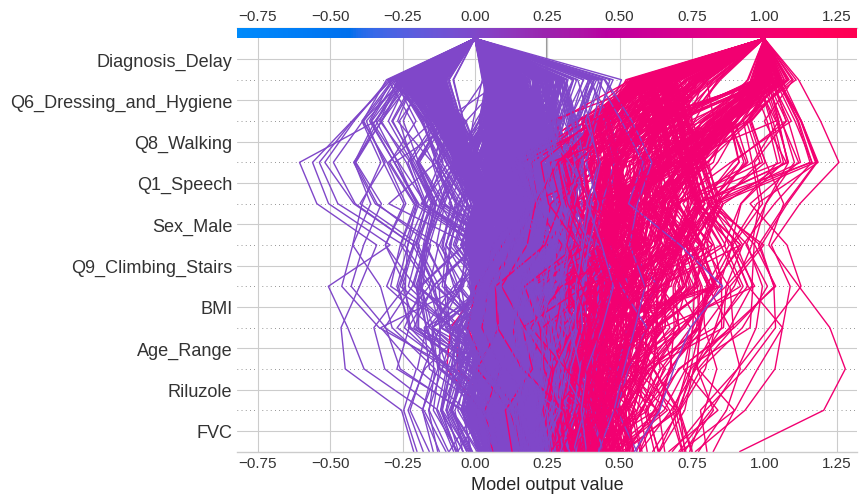

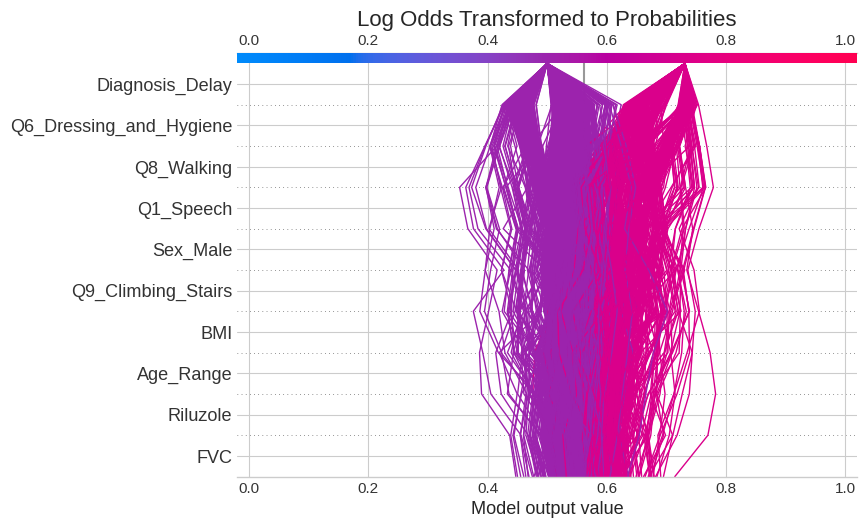

In [8]:
display_range = slice(-1, -11, -1)


shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_values, 
    base_value=base_value,
    show=False,
#     feature_order='hclust', 
    feature_display_range=display_range,
#     plot_color='tab20'
    
)    
plt.show()

# the decision plot supports link='logit' to transform log odds 
# to probabilities.
shap.decision_plot(
    feature_names=feature_names,
    shap_values=shap_values, 
    base_value=base_value,
    link='logit',
    show=False,
#     feature_order='hclust',    
    feature_display_range=display_range,
#     plot_color='tab20'
)    
plt.title('Log Odds Transformed to Probabilities')
plt.show()

[[-0.015   0.016   0.0865 ... -0.0225  0.0075  0.0025]
 [ 0.223   0.067   0.019  ... -0.0135 -0.0035  0.001 ]
 [ 0.21   -0.0195  0.0155 ... -0.0125  0.013   0.0005]
 ...
 [ 0.0115 -0.0865 -0.1445 ... -0.034  -0.0075  0.0015]
 [ 0.246   0.0065  0.033  ... -0.012  -0.0005  0.0015]
 [ 0.208  -0.215   0.038  ... -0.0485 -0.001   0.0015]]


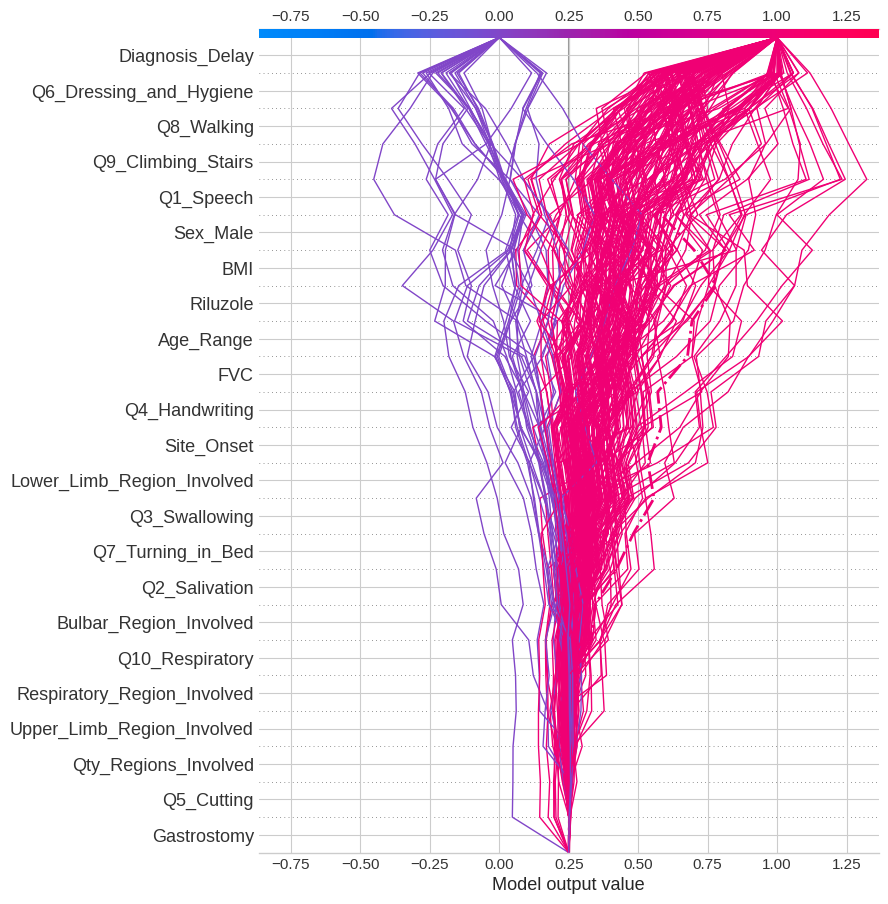

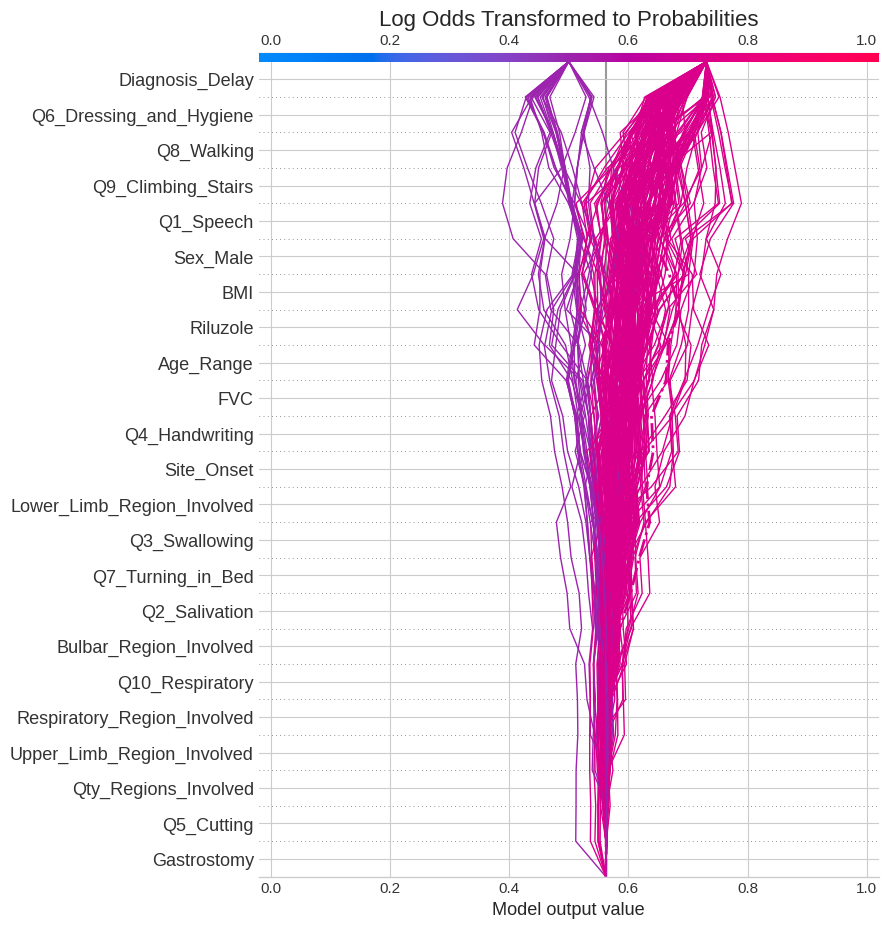

In [7]:
short = pd.DataFrame(y_train, columns=['Class'])
short = short.loc[(short.Class == 1)]


short_samples = shap_values[short.index]

print(short_samples)

# the decision plot supports link='logit' to transform log odds 
# to probabilities.
shap.decision_plot(
    feature_names=feature_names,
    shap_values=short_samples, 
    base_value=base_value,
#     link='logit',
    show=False,
    highlight=0,
    feature_display_range=display_range,
    
)    
plt.show()

shap.decision_plot(
    feature_names=feature_names,
    shap_values=short_samples, 
    base_value=base_value,
    link='logit',
    show=False,
    highlight=0,
    feature_display_range=display_range,
)    
plt.title('Log Odds Transformed to Probabilities')
plt.show()

[[ 0.1825 -0.0215  0.0185 ... -0.024  -0.0035  0.0015]
 [-0.1565  0.0315  0.0145 ... -0.0155 -0.0035  0.002 ]
 [ 0.459  -0.045   0.0175 ... -0.024  -0.0025  0.0015]
 ...
 [ 0.35    0.0165  0.0235 ...  0.0555  0.038   0.002 ]
 [ 0.2415  0.0445 -0.0405 ... -0.016   0.0155  0.001 ]
 [-0.0175  0.0105 -0.0885 ... -0.0305  0.0035 -0.1175]]


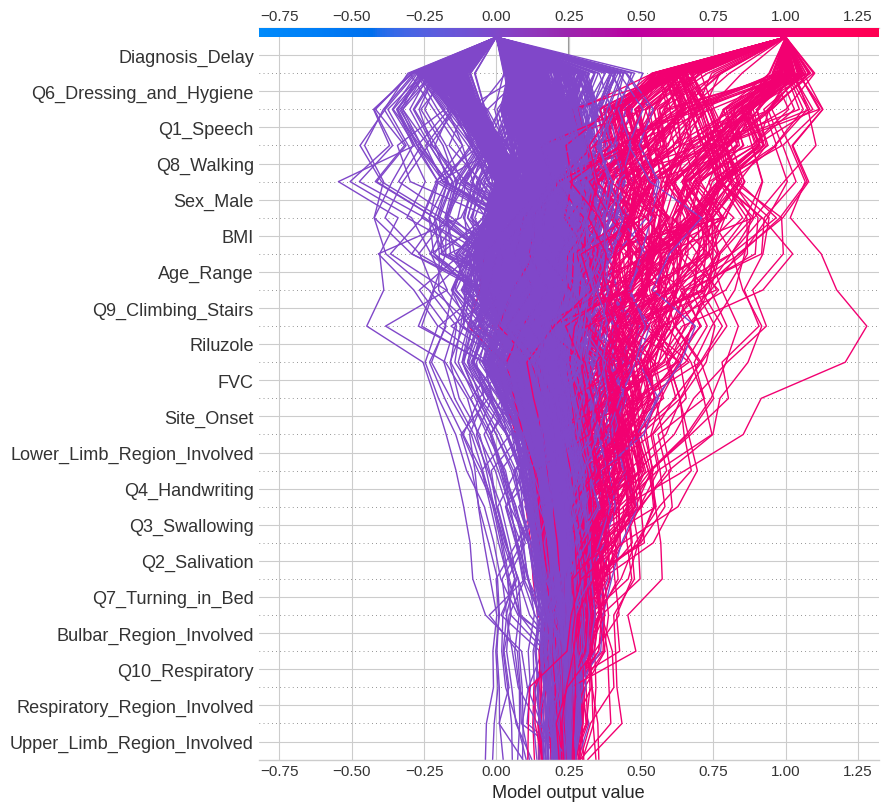

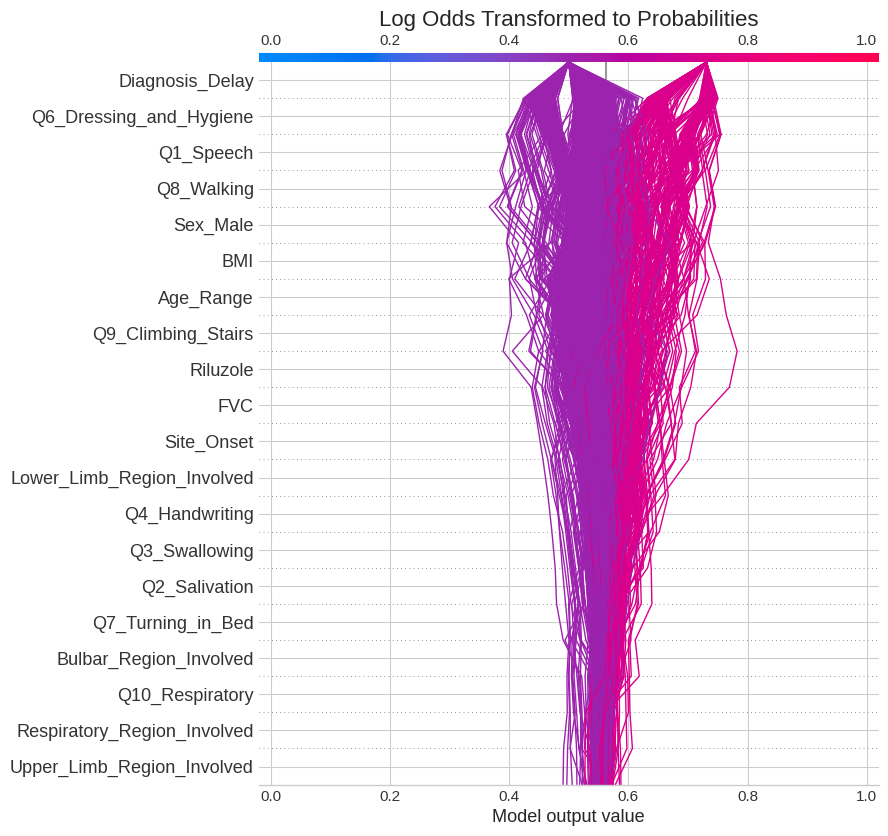

In [151]:
non_short = pd.DataFrame(y_train, columns=['Class'])
non_short = non_short.loc[(non_short.Class == 0)]


short_samples = shap_values[non_short.index]

print(short_samples)

# the decision plot supports link='logit' to transform log odds 
# to probabilities.
shap.decision_plot(
    feature_names=feature_names,
    shap_values=short_samples, 
    base_value=base_value,
#     link='logit',
    show=False,
    highlight=0,
)    
plt.show()

shap.decision_plot(
    feature_names=feature_names,
    shap_values=short_samples, 
    base_value=base_value,
    link='logit',
    show=False,
    highlight=0,
)    
plt.title('Log Odds Transformed to Probabilities')
plt.show()

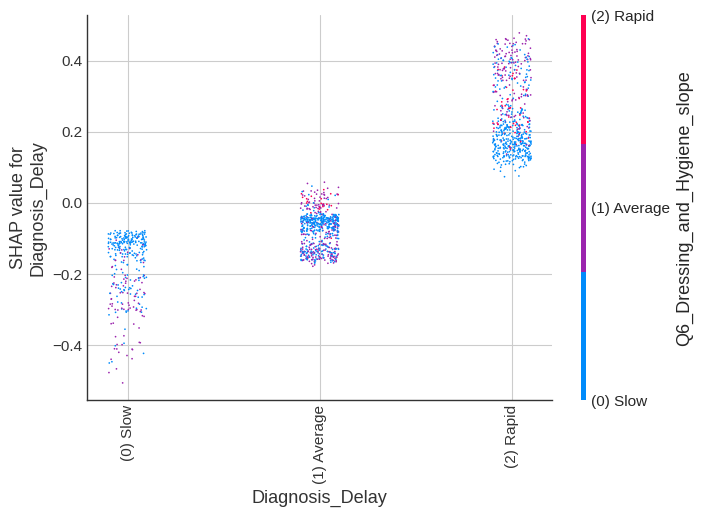

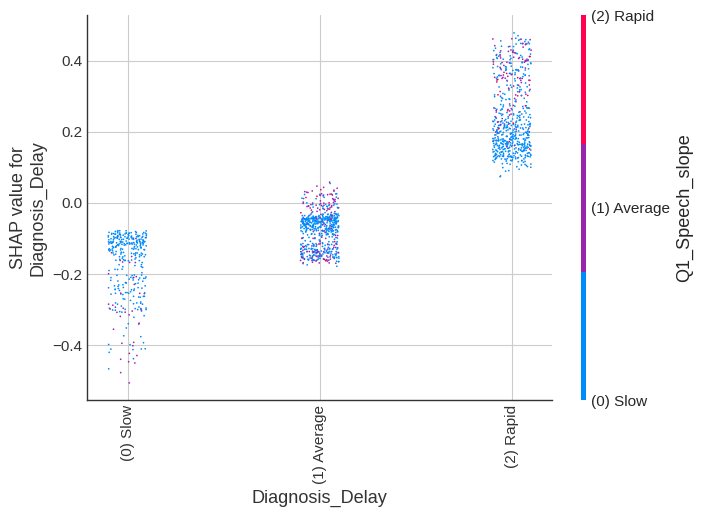

In [88]:
# we can use shap.approximate_interactions to guess which features
# may interact with any feature
inds = shap.approximate_interactions(
    "Diagnosis_Delay", 
    shap_values, 
    X_decoded,
)

# make plots colored by each of the top three possible interacting features
for i in range(2):
    shap.dependence_plot(
        "Diagnosis_Delay", 
        shap_values, 
        X_decoded, 
        interaction_index=inds[i],
#         cmap=plt.get_cmap("Set1"),
#         alpha=0.5,
        x_jitter=0.2, 
        dot_size=1.5,
    )

------------------------
Features Dependence Plot
------------------------


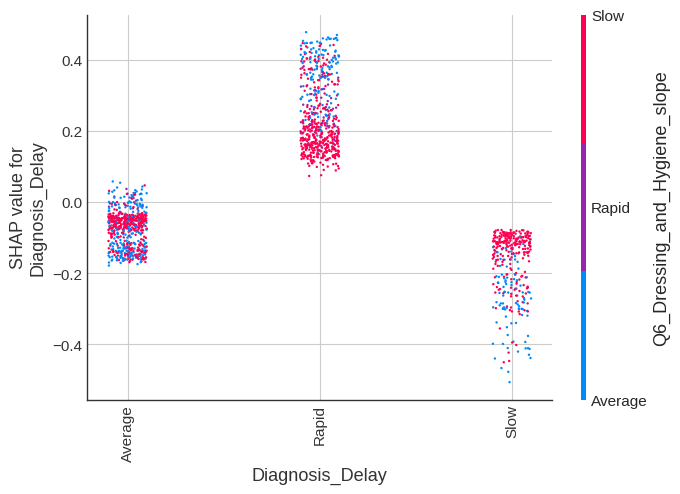

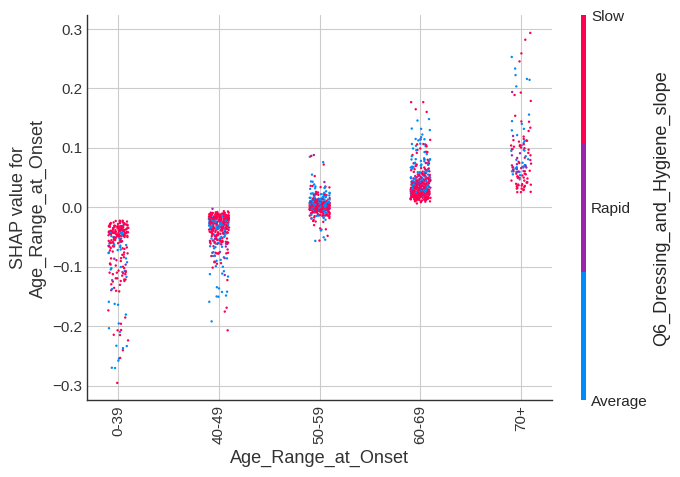

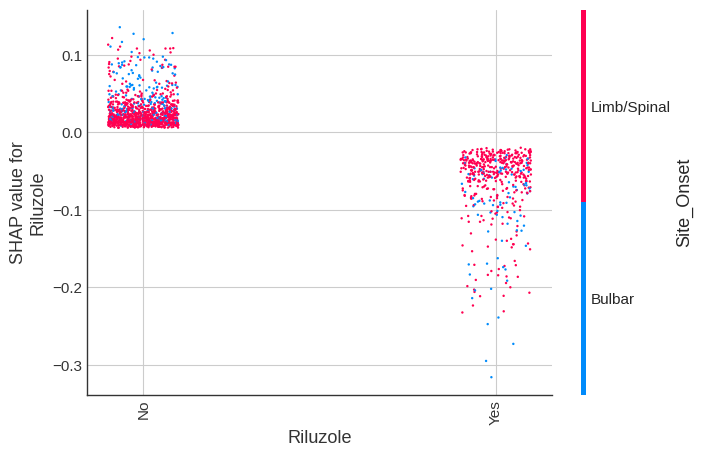

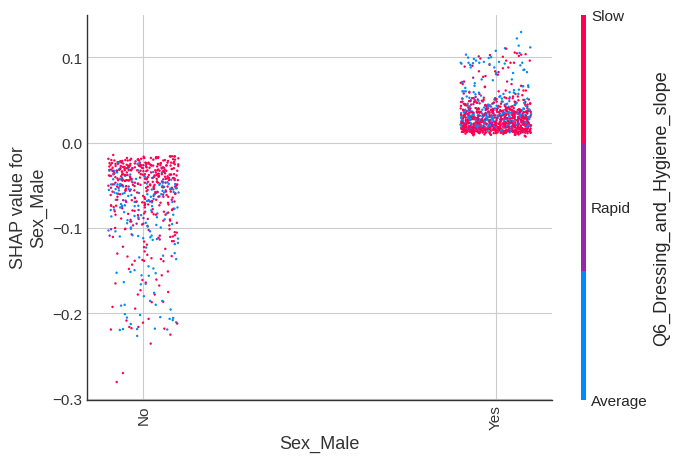

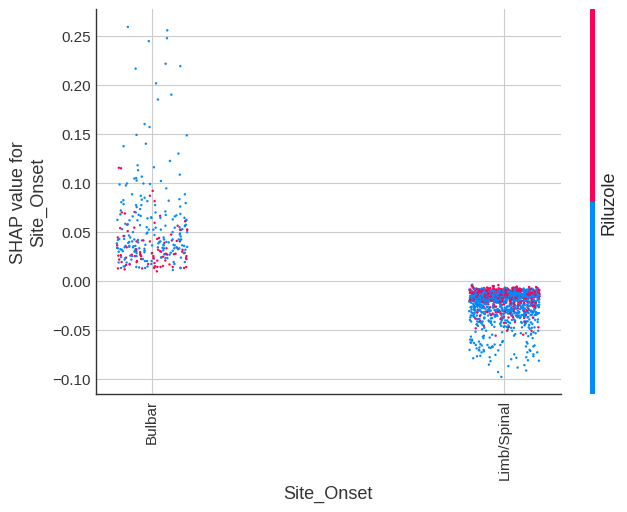

...

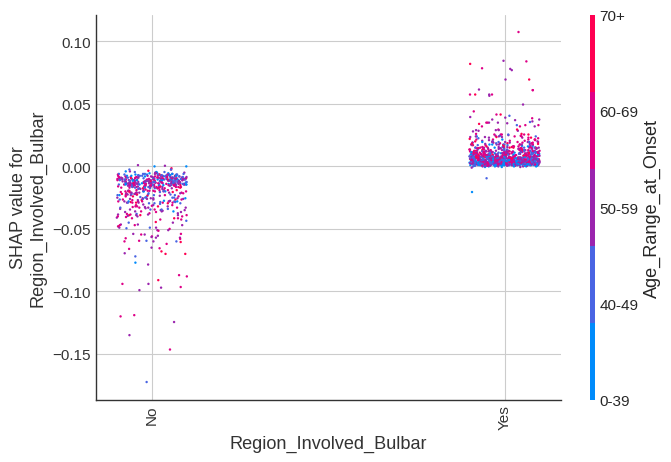

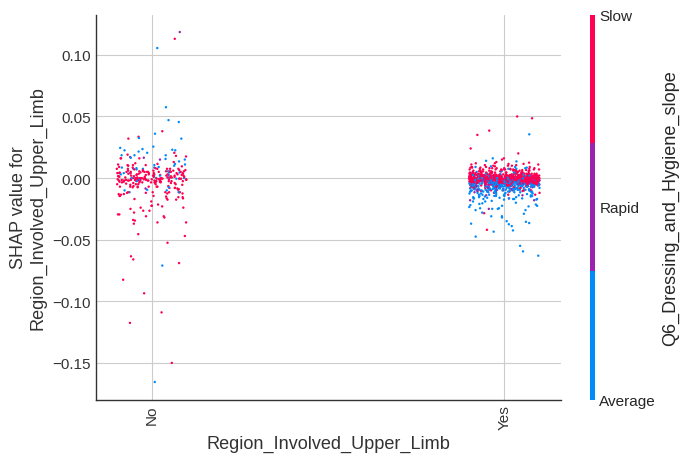

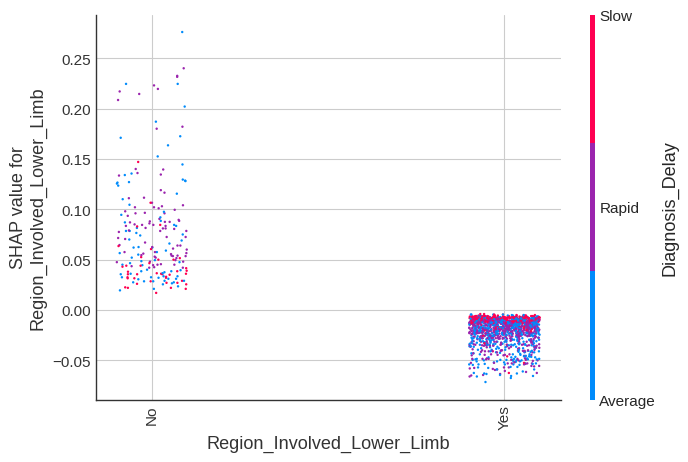

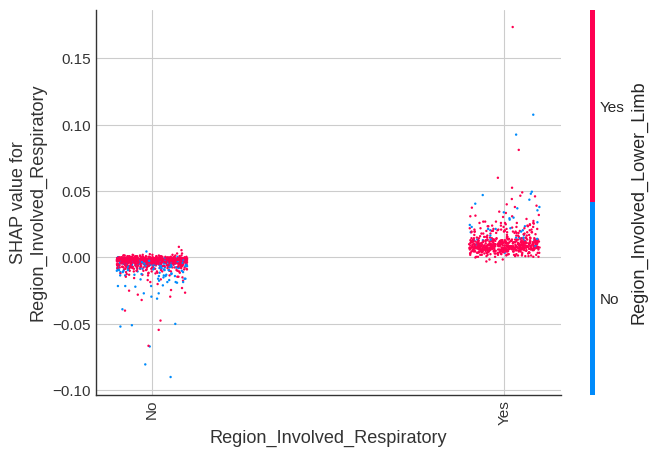

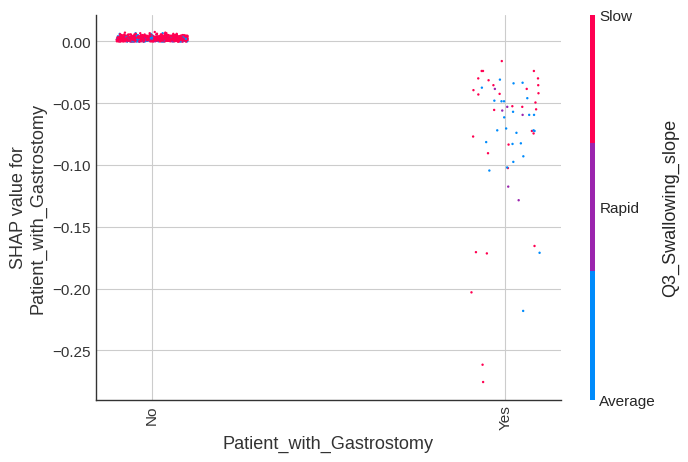

---------------------
Features Interactions
---------------------


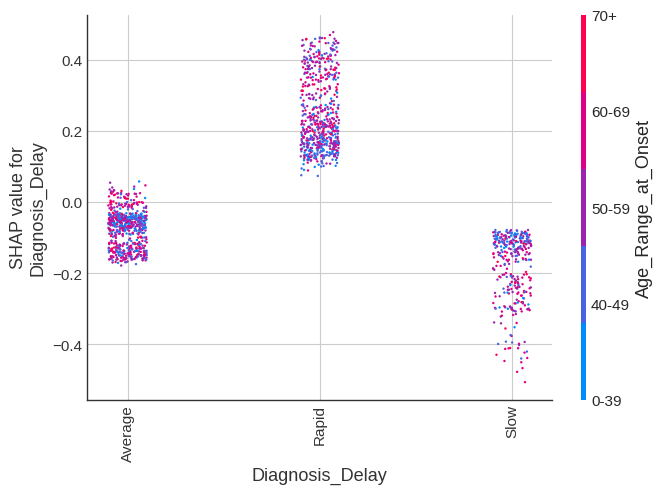

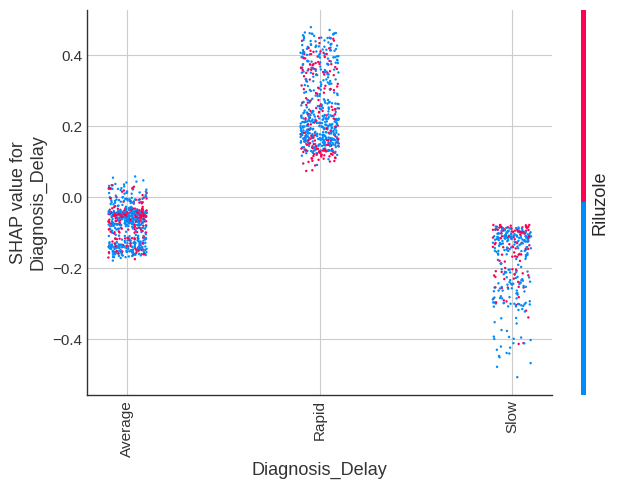

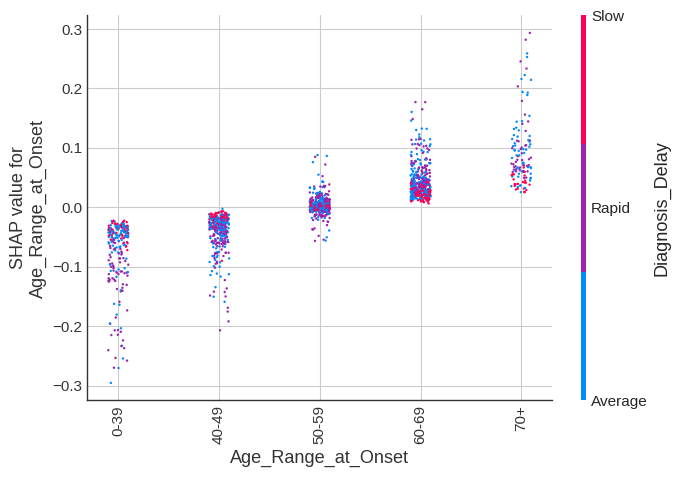

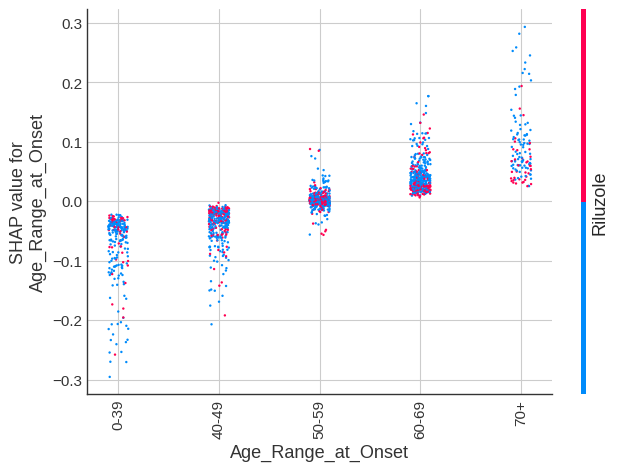

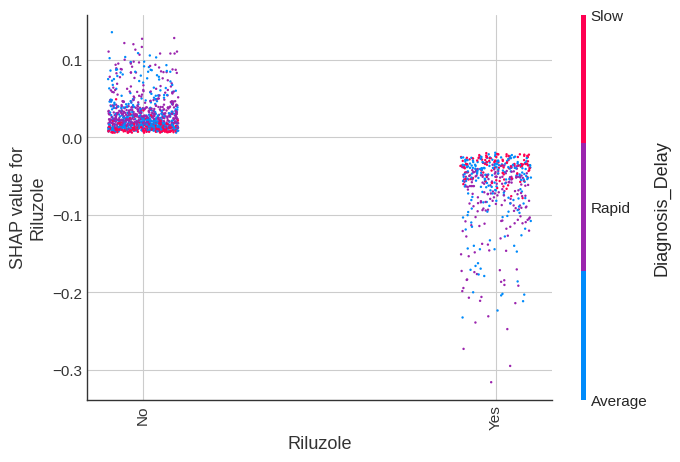

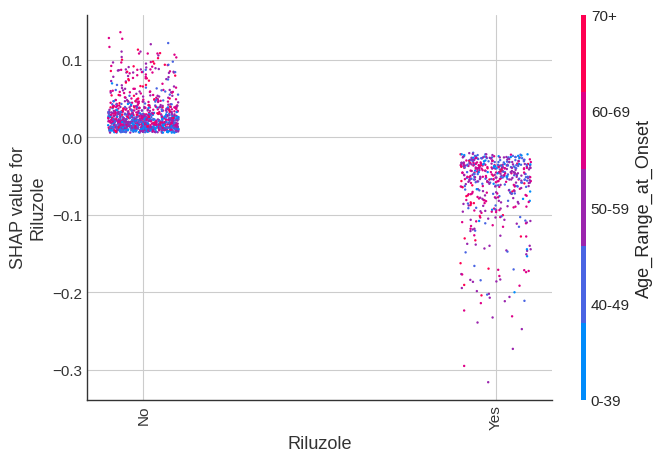

In [121]:
jitter = 0.2
dot_size=3



utils.print_string_with_separators('Features Dependence Plot')
for feat1 in X_decoded.columns:
    shap.dependence_plot(
        feat1, # i'th most important feature 
        shap_values, 
        X_decoded,
#         interaction_index=feat2,
        x_jitter=jitter,
        dot_size=dot_size,
    )


utils.print_string_with_separators('Features Interactions')
for feat1 in X_decoded.columns[0:3]:
    for feat2 in X_decoded.columns[0:3]:
        if feat1 != feat2:
            shap.dependence_plot(
                feat1, # i'th most important feature 
                shap_values, 
                X_decoded,
                interaction_index=feat2,
                x_jitter=jitter,
                dot_size=dot_size,
            )



# shap.dependence_plot(
#     'rank(0)', # i'th most important feature 
#     shap_values, 
#     X_decoded,
#     x_jitter=jitter,
#     dot_size=dot_size,
# )

# shap.dependence_plot(
#     'Age_Range_at_Onset', # i'th most important feature 
#     shap_values, 
#     X_decoded,
#     x_jitter=jitter,
#     dot_size=dot_size,
# )

# shap.dependence_plot(
#     'rank(0)', # i'th most important feature 
#     shap_values, 
#     X_decoded,
#     interaction_index='FVC',
#     x_jitter=jitter,
#     dot_size=dot_size,
# )




## Other SHAP plots

--------
Beeswarm
--------


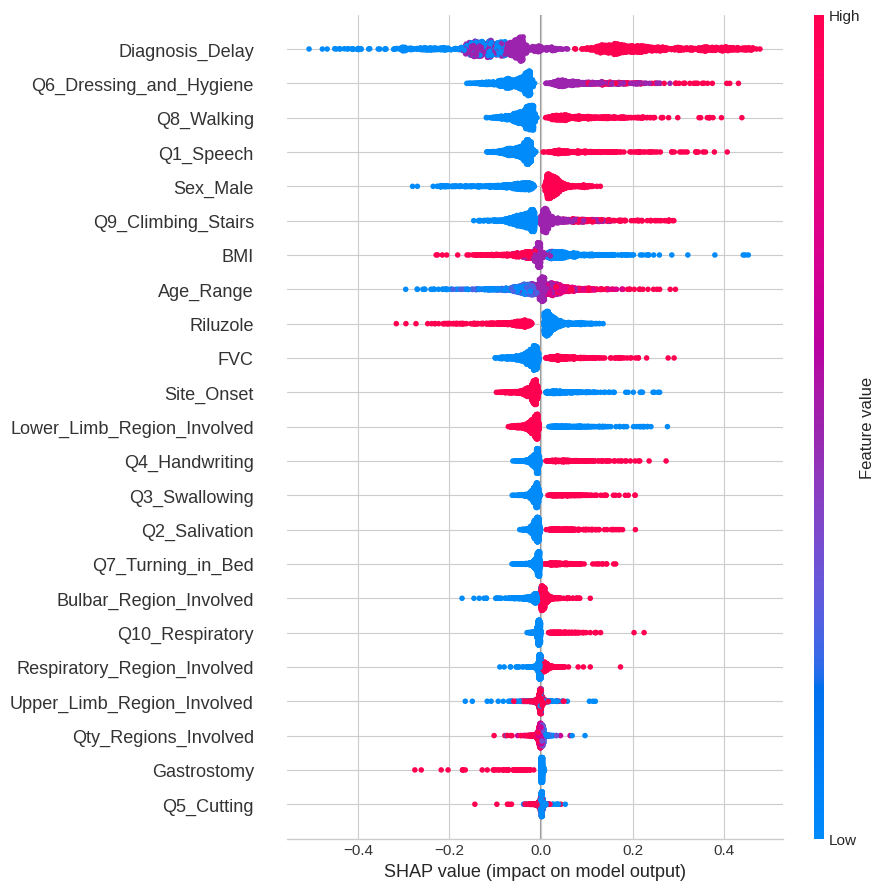

---------
Mean SHAP
---------


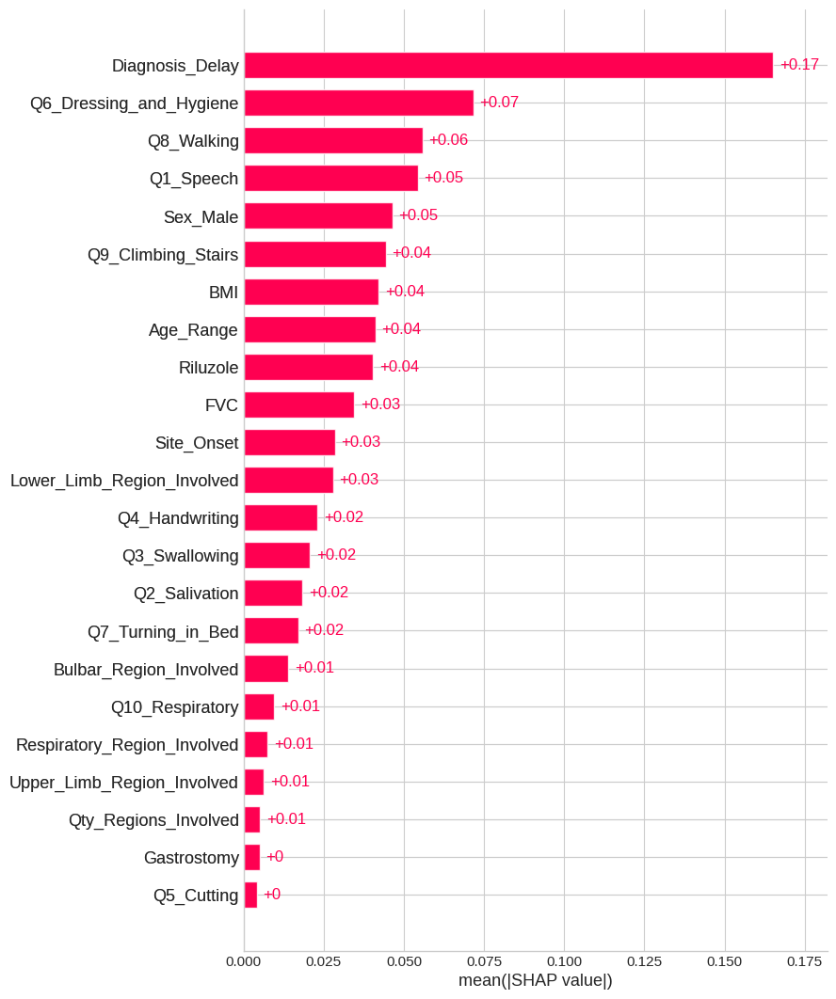

-----------------------
Waterfall (1st. Sample)
-----------------------


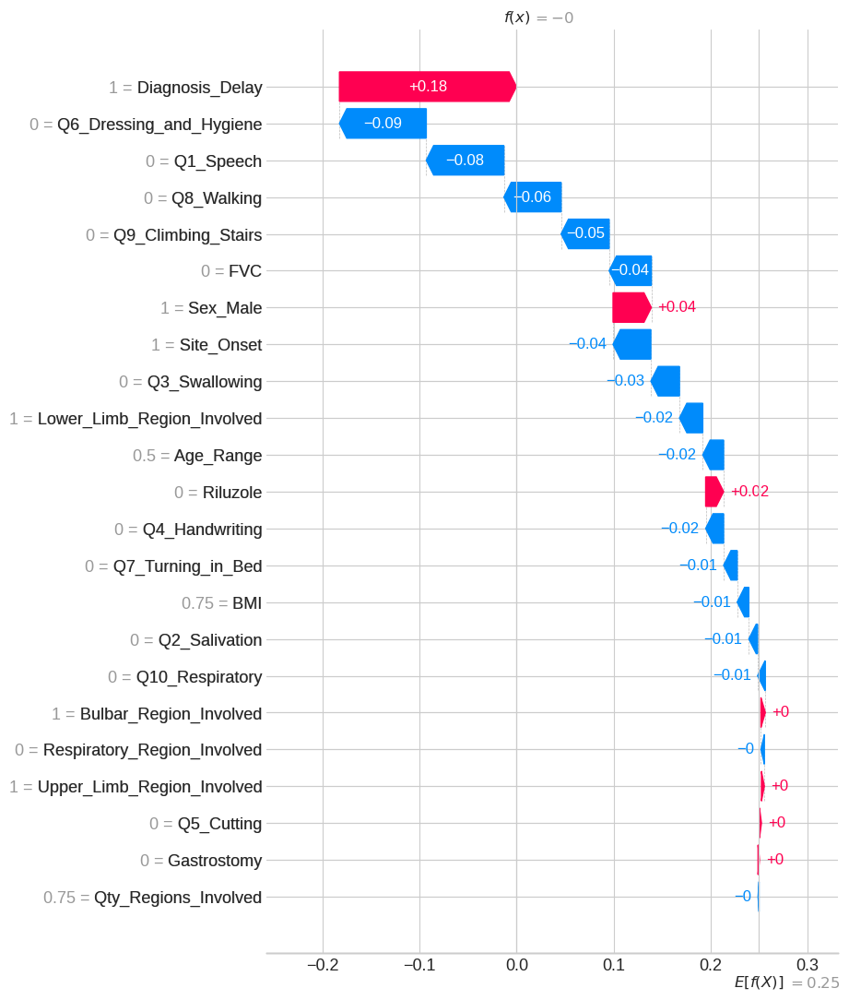

In [37]:
utils.print_string_with_separators('Beeswarm')
shap.plots.beeswarm(
    shap_values_loaded, 
    max_display=25,
)

utils.print_string_with_separators('Mean SHAP')
shap.plots.bar(
    shap_values_loaded, 
    max_display=25,
)


utils.print_string_with_separators('Waterfall (1st. Sample)')
shap.plots.waterfall(shap_values_loaded[0], max_display=25)


---
---
---
# OTHERS

------
Cohort
------


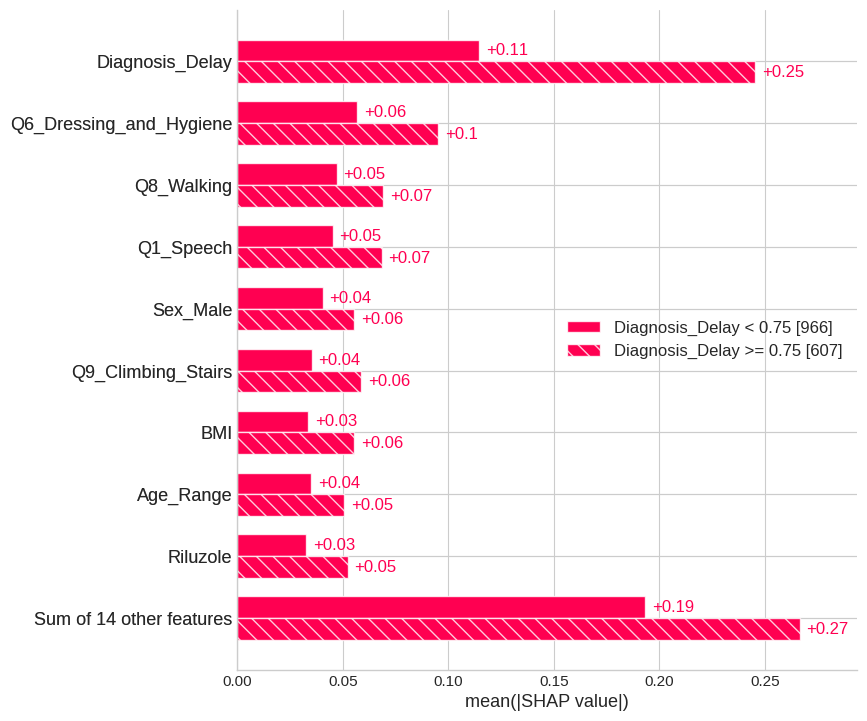

In [112]:
utils.print_string_with_separators('Cohort')
shap.plots.bar(
    shap_values_loaded.cohorts(2).abs.mean(0),
)


In [44]:
utils.print_string_with_separators('Stacked force plot')
shap.plots.force(
    base_value,
    shap_values,
    feature_names=feature_names,
)


------------------
Stacked force plot
------------------


In [42]:
utils.print_string_with_separators('Forceplot')
shap.plots.force(
    base_value,
    shap_values[700],
    feature_names=feature_names,
#     plot_cmap='Greys',
    text_rotation=45,
    link='logit'
)


---------
Forceplot
---------


---------
Waterfall
---------


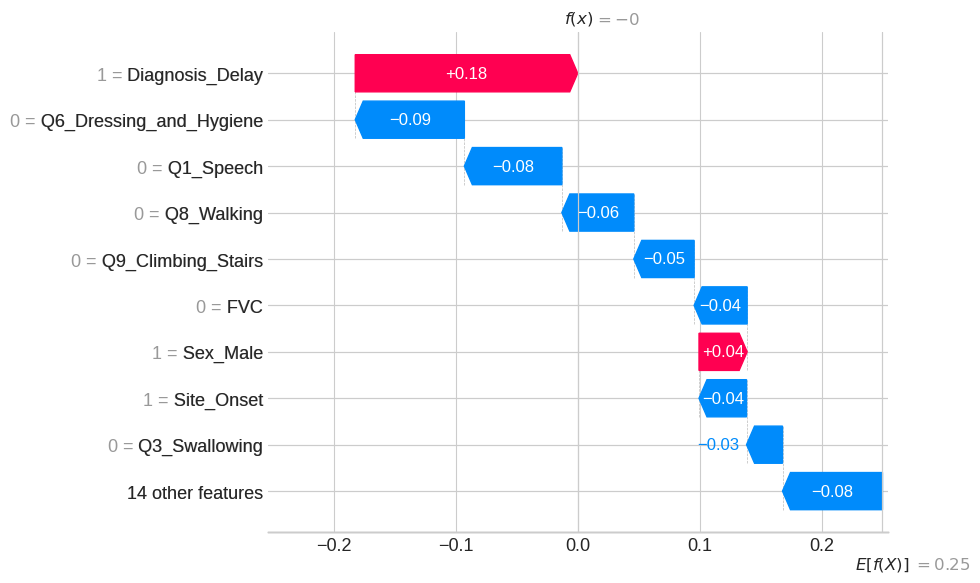

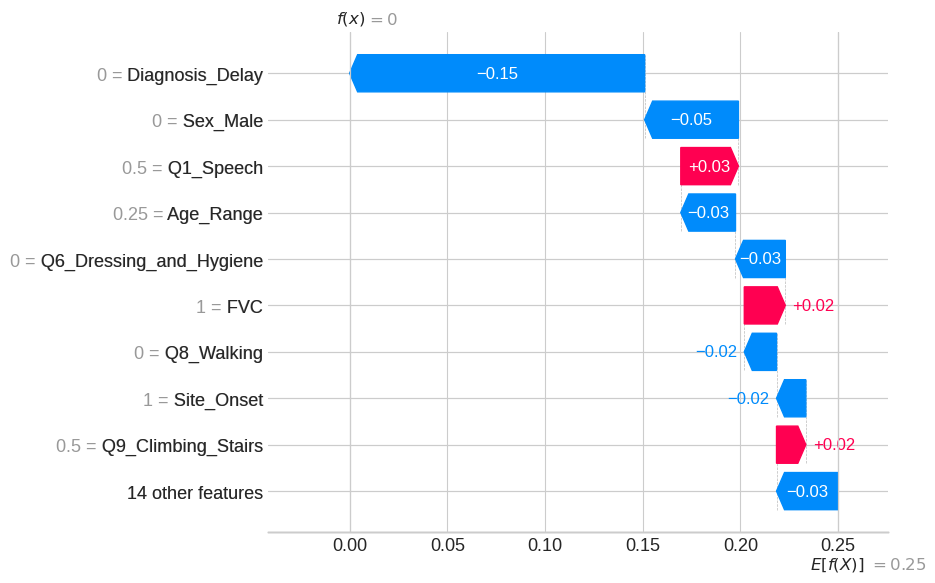

In [50]:
utils.print_string_with_separators('Waterfall')
shap.plots.waterfall(shap_values_loaded[0])
shap.plots.waterfall(shap_values_loaded[1394])

-------
Heatmap
-------


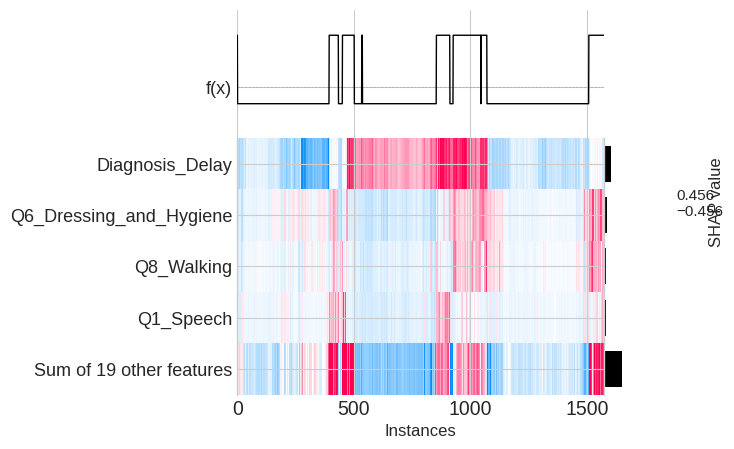

In [113]:
utils.print_string_with_separators('Heatmap')
shap.plots.heatmap(
    shap_values_loaded, 
    max_display=5,
)




-------
Scatter
-------


AttributeError: 'Series' object has no attribute 'reshape'

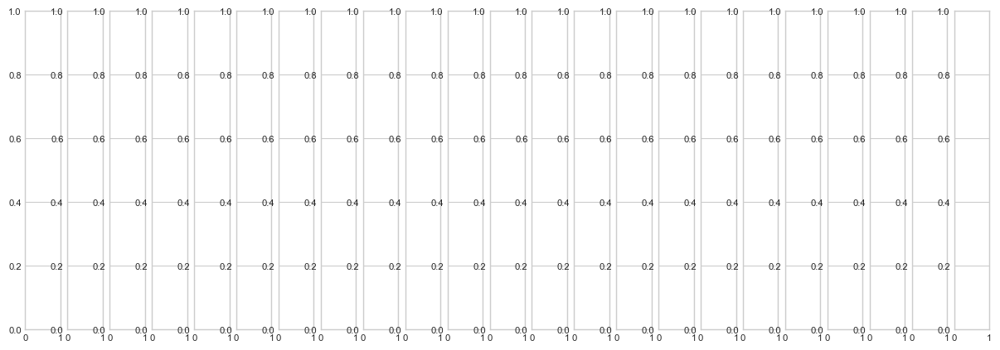

In [47]:
utils.print_string_with_separators('Scatter')
shap.plots.scatter(
    shap_values, 
    hist=False
)




Diagnosis_Delay Diagnosis_Delay


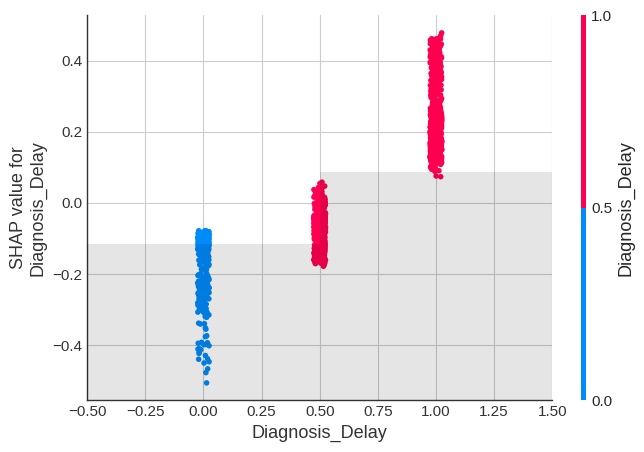

Diagnosis_Delay Age_Range


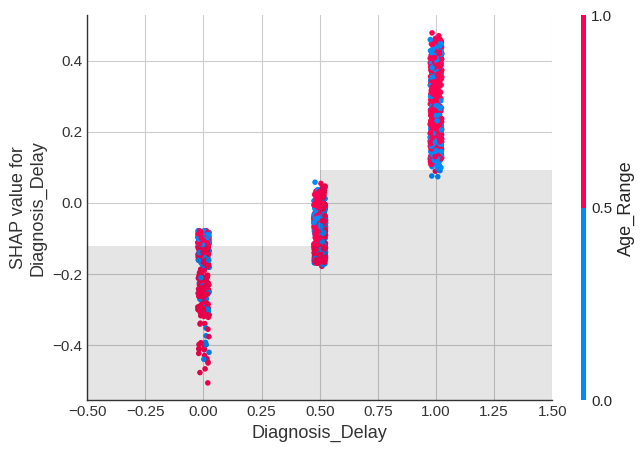

Diagnosis_Delay Riluzole


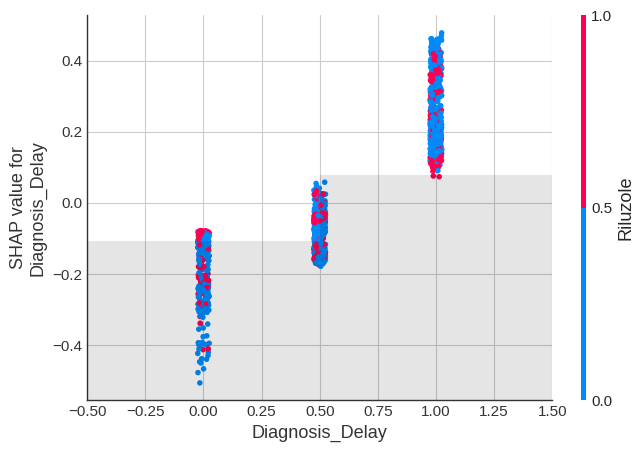

Age_Range Diagnosis_Delay


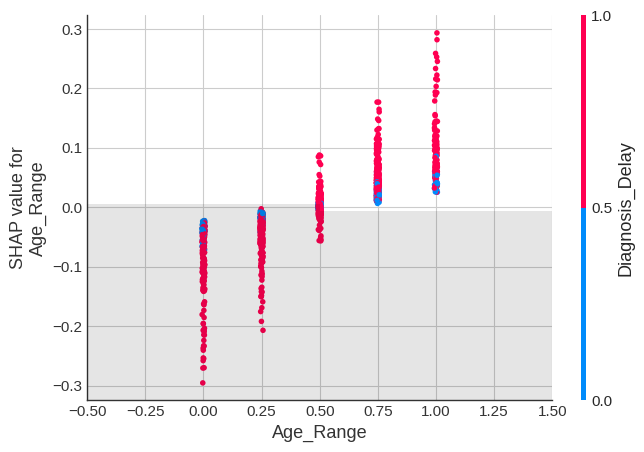

Age_Range Age_Range


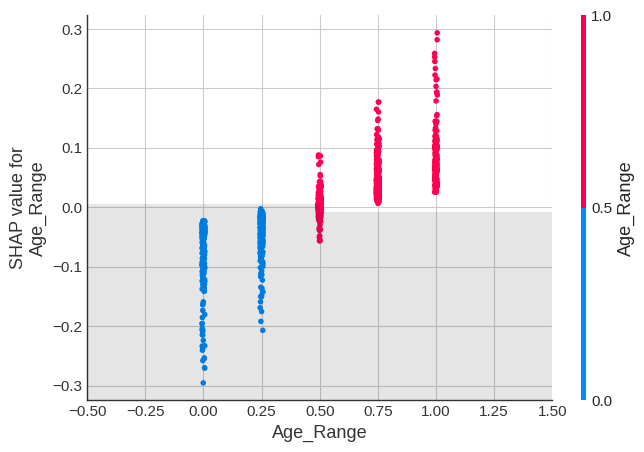

Age_Range Riluzole


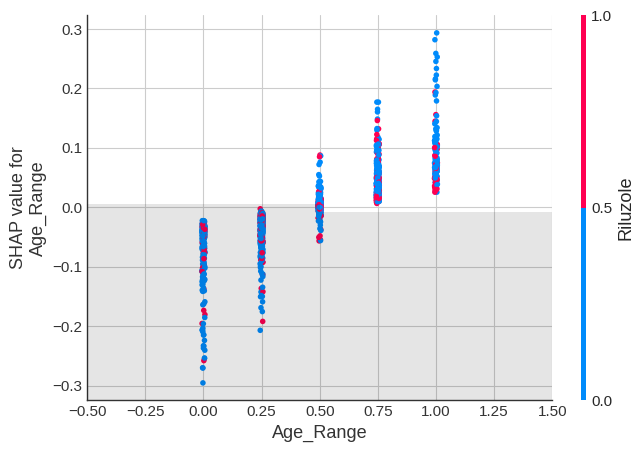

Riluzole Diagnosis_Delay


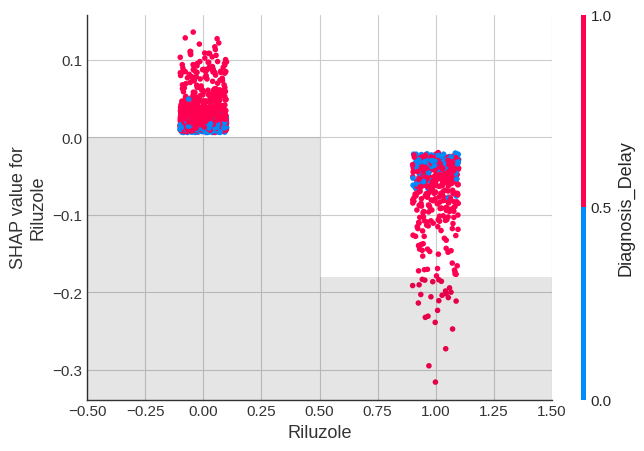

Riluzole Age_Range


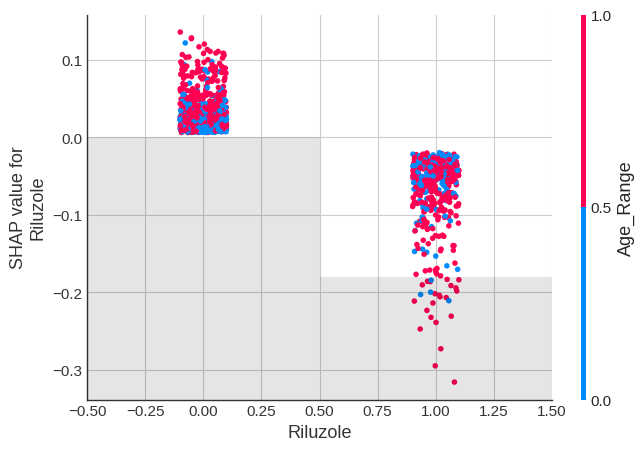

Riluzole Riluzole


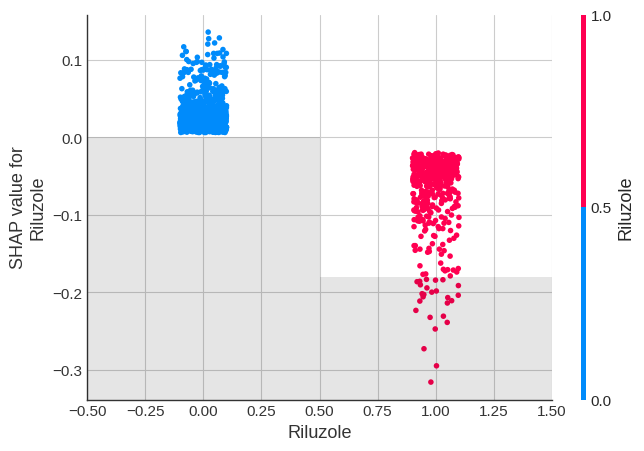

In [89]:
for feat1 in shap_values_loaded.feature_names[0:3]:
    for feat2 in shap_values_loaded.feature_names[0:3]:
        print(feat1, feat2)
        shap.plots.scatter(
            shap_values_loaded[:,feat1],
            color=shap_values_loaded[:,feat2]
        )


